In [1]:
# CELL 1
import os
import matplotlib.pyplot as plt
import matplotlib
import datetime
from scipy import stats
import numpy as np
import pandas as pd

import notebook_utils
    
%matplotlib inline

coin = "btc_usd"
df = notebook_utils.load_time_bars_df(coin, exchange_name="bitmex")
df

,level_0,symbol,open_date,close_date,close,high,low,volume_usd,volume_coin,num_trades_in_bar,pct_change,price_change,short_price_change
index,,,,,,,,,,,,,
2016-01-01 00:06:00+00:00,2016-01-01 00:00:00+00:00,btc_usd,2016-01-01 00:06:00+00:00,2016-01-02 00:00:00+00:00,435.99,436.70,426.37,8.969094e+05,2.070698e+03,757.0,NaN,NaN,NaN
2016-01-02 00:00:00+00:00,2016-01-02 00:00:00+00:00,btc_usd,2016-01-02 00:00:00+00:00,2016-01-03 00:00:00+00:00,435.00,438.00,429.25,1.368007e+06,3.159068e+03,695.0,-0.002271,0.997729,1.002271
2016-01-03 00:00:00+00:00,2016-01-03 00:00:00+00:00,btc_usd,2016-01-03 00:00:00+00:00,2016-01-04 00:00:00+00:00,429.79,435.40,422.14,2.240951e+06,5.224797e+03,1133.0,-0.011977,0.988023,1.011977
2016-01-04 00:00:00+00:00,2016-01-04 00:00:00+00:00,btc_usd,2016-01-04 00:00:00+00:00,2016-01-05 00:00:00+00:00,432.30,436.44,427.50,1.492213e+06,3.450867e+03,848.0,0.005840,1.005840,0.994160
2016-01-05 00:00:00+00:00,2016-01-05 00:00:00+00:00,btc_usd,2016-01-05 00:00:00+00:00,2016-01-06 00:00:00+00:00,432.57,434.97,429.00,8.971873e+05,2.076792e+03,873.0,0.000625,1.000625,0.999375
2016-01-06 00:00:00+00:00,2016-01-06 00:00:00+00:00,btc_usd,2016-01-06 00:00:00+00:00,2016-01-07 00:00:00+00:00,428.72,432.20,425.01,1.025789e+06,2.386996e+03,699.0,-0.008900,0.991100,1.008900
2016-01-07 00:00:00+00:00,2016-01-07 00:00:00+00:00,btc_usd,2016-01-07 00:00:00+00:00,2016-01-08 00:00:00+00:00,461.02,464.04,426.12,6.958440e+06,1.542522e+04,4200.0,0.075341,1.075341,0.924659
2016-01-08 00:00:00+00:00,2016-01-08 00:00:00+00:00,btc_usd,2016-01-08 00:00:00+00:00,2016-01-09 00:00:00+00:00,453.53,469.49,445.42,6.182145e+06,1.355745e+04,4139.0,-0.016247,0.983753,1.016247
2016-01-09 00:00:00+00:00,2016-01-09 00:00:00+00:00,btc_usd,2016-01-09 00:00:00+00:00,2016-01-10 00:00:00+00:00,450.00,454.81,444.86,3.262375e+06,7.244277e+03,2572.0,-0.007783,0.992217,1.007783


In [2]:
# CELL 2
# We set the dates for which we want to run our analysis.
start_date = '2017-01-01'
# start_date = '2019-01-01'
end_date = '2019-05-01'
# end_date = '2020-01-01'
analysis_options = dict(
    start_date=start_date,
    end_date=end_date,
    bars_per_day=1,
    extra_columns=[
        ["P(H_up_bar)", "P(up_bar|H_up_bar)", "P(up_bar)"],
    ],
)

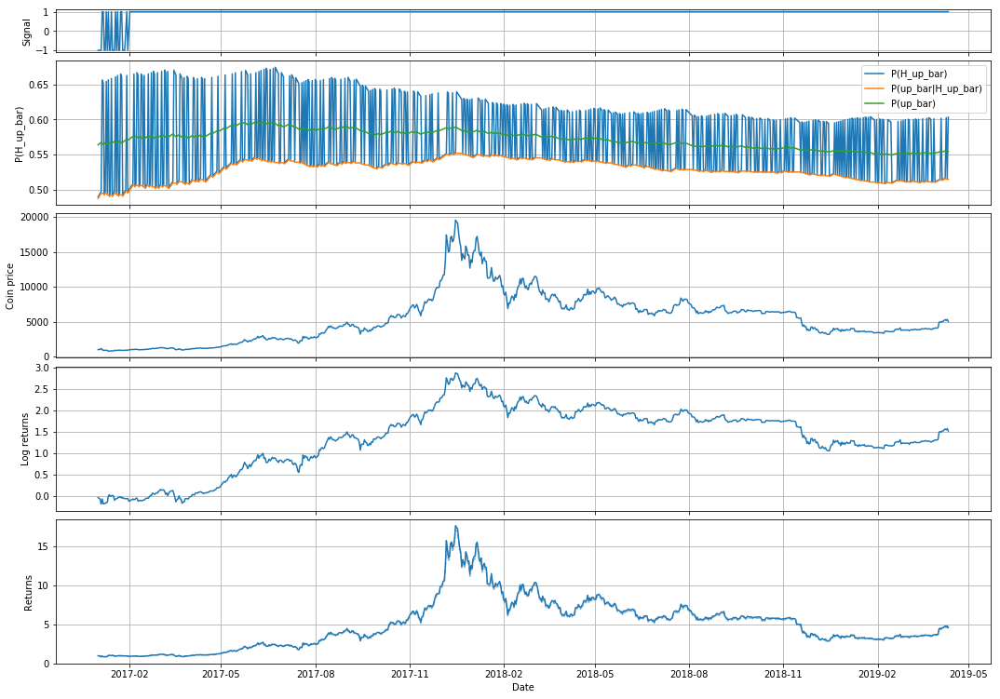

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[]
	Returns: 4.551283852745758
	Returns after fees: 4.436650905779966
	SR: 0.7213894511011779
	SR (after fees): 0.7091244879469648
	% bars right: 0.5416164053075995
	% bars in market: 0.9975932611311673
	Bars count: 831


In [3]:
# CELL 3
def expanding_signal(df):
    df["pct_change"] = df["pct_change"].fillna(0)
    
    # Compute features for each bar
    df["up_bar"] = df["pct_change"] >= 0
    df["~up_bar"] = df["pct_change"] < 0
    # `hypotheses` contains the features we want to see in the next bar
    # For example, P(H_up_bar) is the probability of seeing `up_bar` feature in the next bar
    hypotheses = ["up_bar", "~up_bar"]
    # `features` are the bar features we update on
    features = ["up_bar", "~up_bar"]
    
    # Compute priors
    # For example, P(next_up_bar) = P(up_bar); note: this is debateable; we could start with a prior of 0.5
    for h in hypotheses:
        df[f"P(H_{h})"] = df[f"{h}"].expanding().mean()
    # Make sure we have priors for all hypotheses and they sum up to 1
    assert np.all([f"P(H_{h})" in df for h in hypotheses])
    assert np.all([np.isclose(np.sum([df.loc[i][f"P(H_{h})"] for h in hypotheses]), 1.0) for i in df.index])
    
    for h in hypotheses:
        for f in features:
            # Updated P(H) = P(H) * P(f|H) / P(f)
            # Since we'll normalize later, we just have:
            # Updated P(H) = P(H) * P(f|H)
            # By definition of conditional probability: P(f|H) = P(f & H) / P(H)
            # To avoid peeking at future data, we reframe our probability slightly:
            # P(f|H) = P(f in last bar & H this bar) / P(H this bar)
            # We'll call "f in last bar" "prev_f"; and P(H this bar) just means probability of seeing the
            # hypothesis feature (from our `hypotheses` list) in the current bar
            df[f"prev_{f},{h}"] = np.where(df[f].shift(1) & df[h], 1, 0)
            df[f"P(prev_{f},{h})"] = df[f"prev_{f},{h}"].expanding().mean()
            df[f"P({h})"] = df[f"{h}"].expanding().mean()
            df[f"P({f}|H_{h})"] = df[f"P(prev_{f},{h})"] / df[f"P({h})"]
            # Where we see feature `f` in the current bar, we'll update our hypothesis of seeing `h` in the next bar
            df[f"P(H_{h})"] *= np.where(df[f"{f}"], df[f"P({f}|H_{h})"], 1)
    
    # Normalize
    df[f"total_H_sum"] = 0
    for h in hypotheses:
        df[f"total_H_sum"] += df[f"P(H_{h})"]
    for h in hypotheses:
        df[f"P(H_{h})"] /= df[f"total_H_sum"]
    # Make sure all posteriors now sum up to 1 (but ignore the first few values because of various boundary issues)
    assert np.all([np.isclose(np.sum([df.loc[i][f"P(H_{h})"] for h in hypotheses]), 1.0) for i in df.index[2:]])

    df["strat_signal"] = np.sign(df["P(H_up_bar)"] - 0.5)
    return df

simulation_result = notebook_utils.simulate(expanding_signal, df)
analysis_result = notebook_utils.graph_print_analyze_simulation_result(simulation_result, analysis_options)

In [4]:
# CELL 4
def const_bars_signal(df, history_bars):
    df["pct_change"] = df["pct_change"].fillna(0)
    
    # Compute features for each bar
    df["up_bar"] = df["pct_change"] >= 0
    df["~up_bar"] = df["pct_change"] < 0
    # `hypotheses` contains the features we want to see in the next bar
    # For example, P(H_up_bar) is the probability of seeing `up_bar` feature in the next bar
    hypotheses = ["up_bar", "~up_bar"]
    # `features` are the bar features we update on
    features = ["up_bar", "~up_bar"]
    
    # Compute priors
    # For example, P(next_up_bar) = P(up_bar); note: this is debateable; we could start with a prior of 0.5
    for h in hypotheses:
        df[f"P(H_{h})"] = df[f"{h}"].rolling(history_bars).mean()
    # Make sure we have priors for all hypotheses and they sum up to 1
    assert np.all([f"P(H_{h})" in df for h in hypotheses])
    assert np.all([np.isclose(np.sum([df.loc[i][f"P(H_{h})"] for h in hypotheses]), 1.0) for i in df.index[history_bars:]])
    
    for h in hypotheses:
        for f in features:
            # Updated P(H) = P(H) * P(f|H) / P(f)
            # Since we'll normalize later, we just have:
            # Updated P(H) = P(H) * P(f|H)
            # By definition of conditional probability: P(f|H) = P(f & H) / P(H)
            # To avoid peeking at future data, we reframe our probability slightly:
            # P(f|H) = P(f in last bar & H this bar) / P(H this bar)
            # We'll call "f in last bar" "prev_f"; and P(H this bar) just means probability of seeing the
            # hypothesis feature (from our `hypotheses` list) in the current bar
            df[f"prev_{f},{h}"] = np.where(df[f].shift(1) & df[h], 1, 0)
            df[f"P(prev_{f},{h})"] = df[f"prev_{f},{h}"].rolling(history_bars).mean()
            df[f"P({h})"] = df[f"{h}"].rolling(history_bars).mean()
            df[f"P({f}|H_{h})"] = df[f"P(prev_{f},{h})"] / df[f"P({h})"]
            # Where we see feature `f` in the current bar, we'll update our hypothesis of seeing `h` in the next bar
            df[f"P(H_{h})"] *= np.where(df[f"{f}"], df[f"P({f}|H_{h})"], 1)
    
    # Normalize
    df[f"total_H_sum"] = 0
    for h in hypotheses:
        df[f"total_H_sum"] += df[f"P(H_{h})"]
    for h in hypotheses:
        df[f"P(H_{h})"] /= df[f"total_H_sum"]
    # Make sure all posteriors now sum up to 1 (but ignore the first few values because of various boundary issues)
    #assert np.all([np.isclose(np.sum([df.loc[i][f"P(H_{h})"] for h in hypotheses]), 1.0) for i in df.index[history_bars:]])

    df["strat_signal"] = np.sign(df["P(H_up_bar)"] - 0.5)
    return df

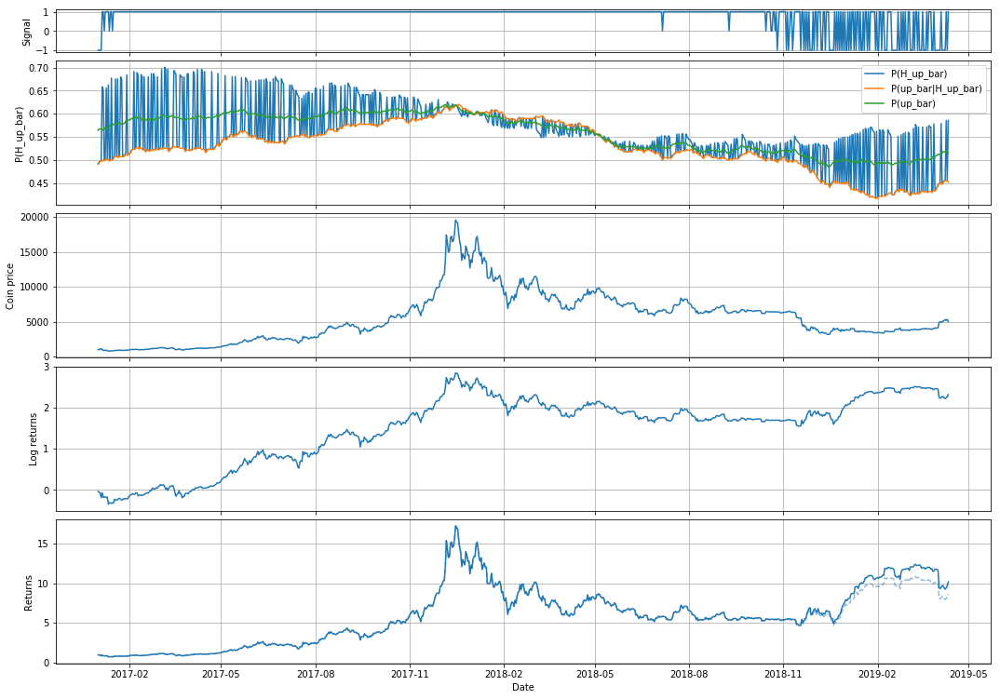

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[365]
	Returns: 10.169646005388238
	Returns after fees: 8.68717942661912
	SR: 1.1249471734333005
	SR (after fees): 1.048316887417207
	% bars right: 0.5543345543345544
	% bars in market: 0.9855595667870036
	Bars count: 831


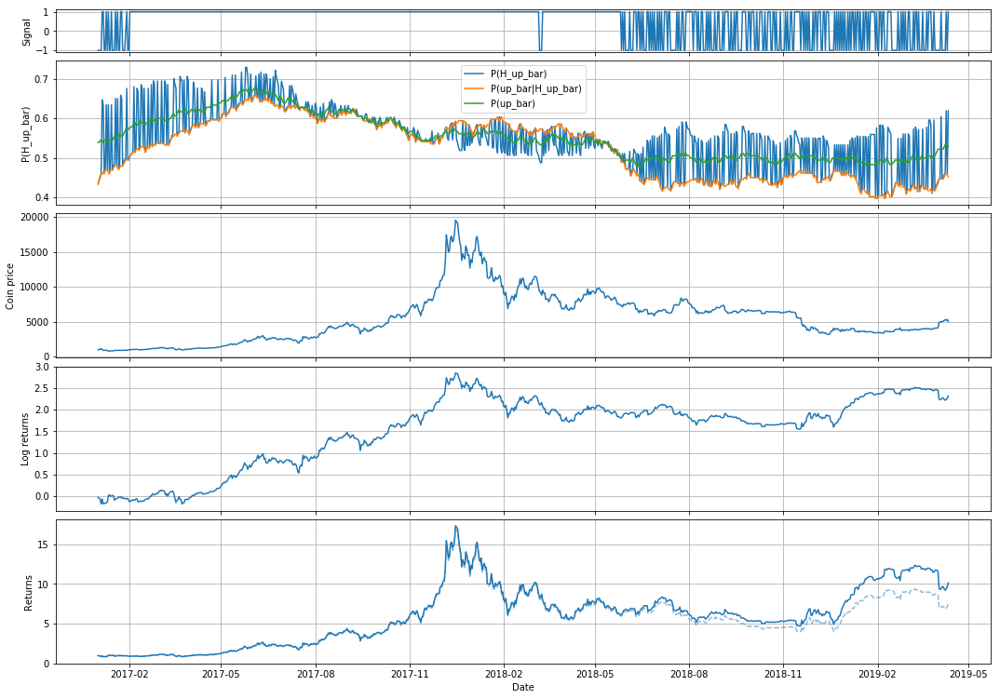

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[180]
	Returns: 10.139420734840414
	Returns after fees: 7.4993605036476705
	SR: 1.1225912477564717
	SR (after fees): 0.9749690984129173
	% bars right: 0.5614457831325301
	% bars in market: 0.9987966305655837
	Bars count: 831


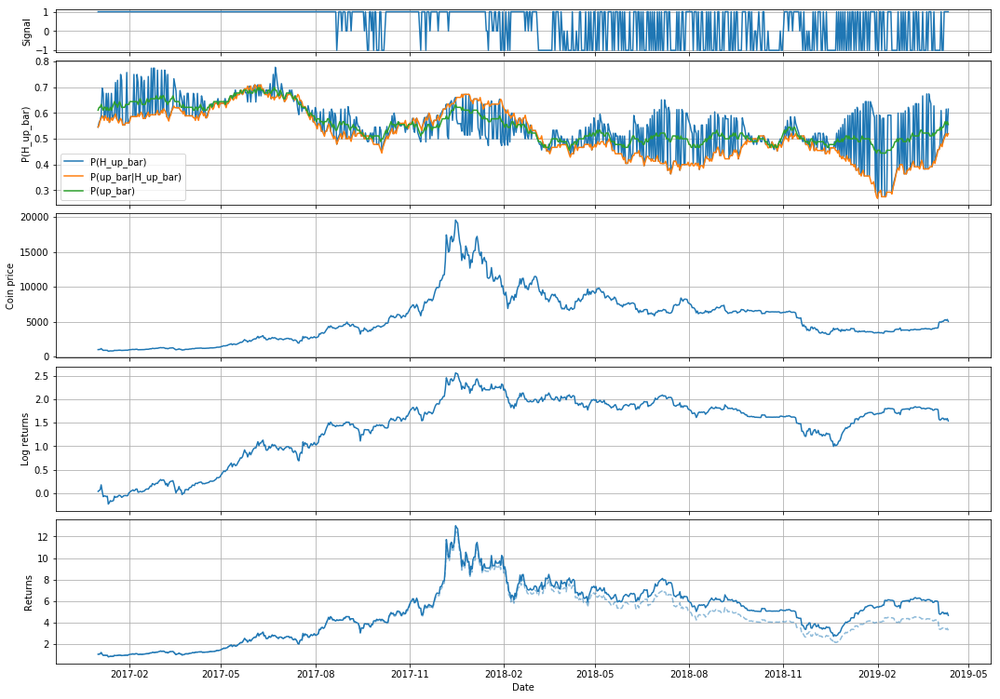

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[90]
	Returns: 4.65490459184264
	Returns after fees: 3.2667271046536546
	SR: 0.7567627366963415
	SR (after fees): 0.5757532654062101
	% bars right: 0.5483460559796438
	% bars in market: 0.9458483754512635
	Bars count: 831


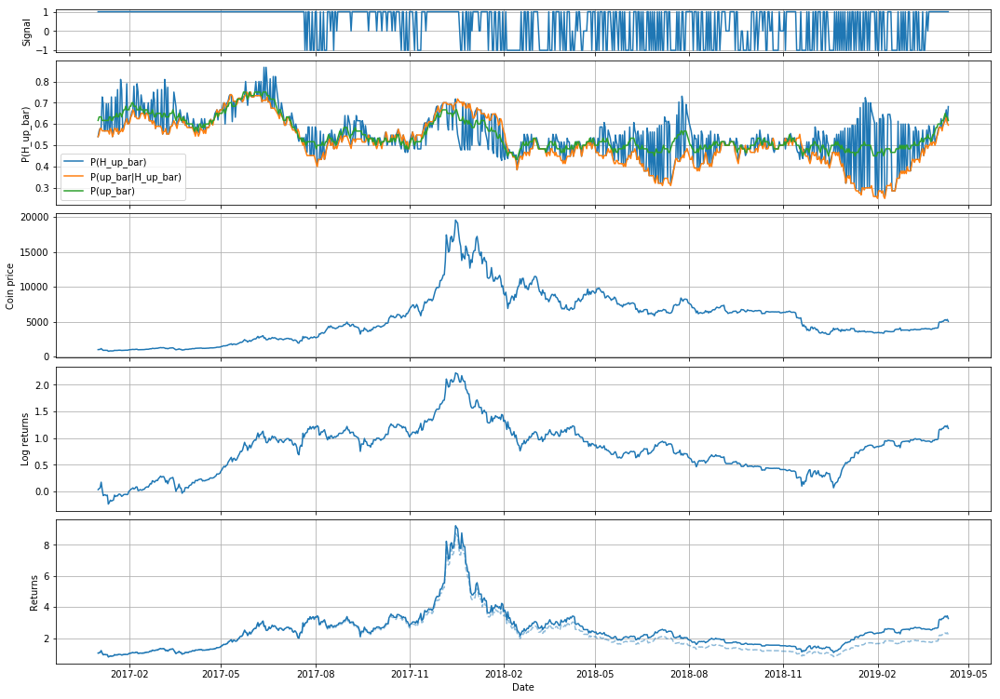

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[60]
	Returns: 3.2575666919361423
	Returns after fees: 2.221842916108315
	SR: 0.5613056880869648
	SR (after fees): 0.3692023020609356
	% bars right: 0.5537084398976982
	% bars in market: 0.941034897713598
	Bars count: 831


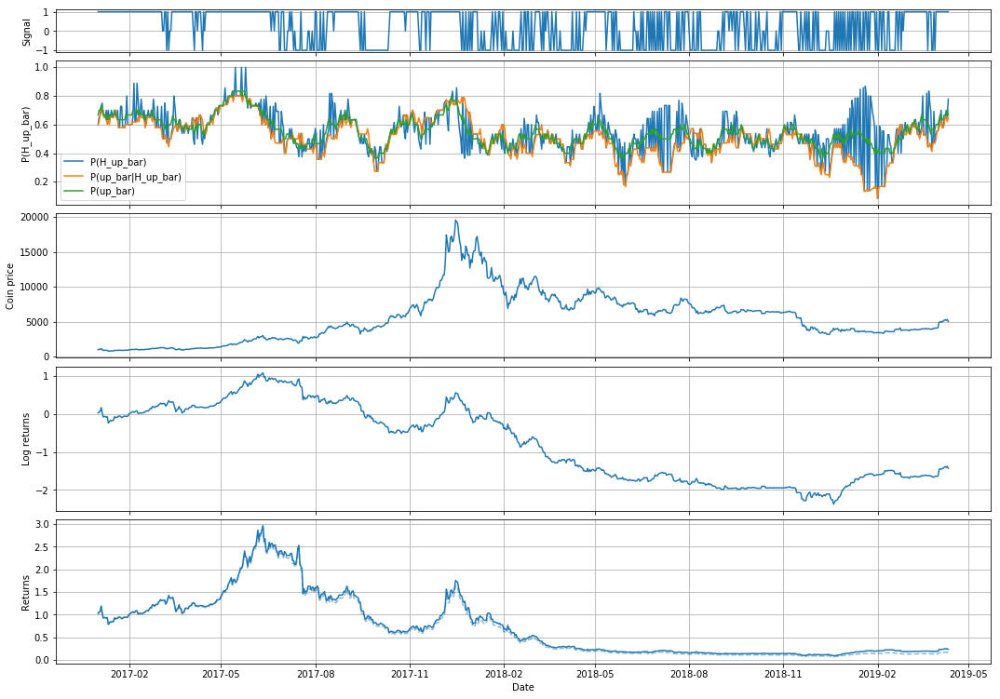

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[30]
	Returns: 0.2386174371939015
	Returns after fees: 0.16720627152731277
	SR: -0.7821730388702461
	SR (after fees): -0.9681724732119285
	% bars right: 0.5177398160315374
	% bars in market: 0.9157641395908543
	Bars count: 831


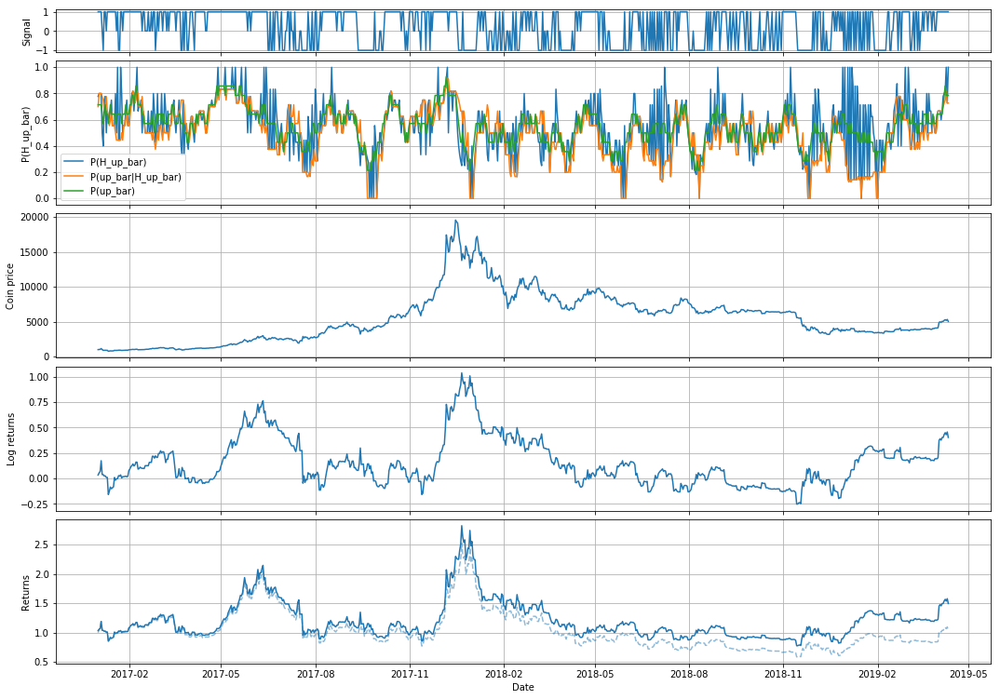

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[14]
	Returns: 1.495407037352549
	Returns after fees: 1.0384837116254064
	SR: 0.17922609587943678
	SR (after fees): -0.015749488425403416
	% bars right: 0.5227920227920227
	% bars in market: 0.8447653429602888
	Bars count: 831


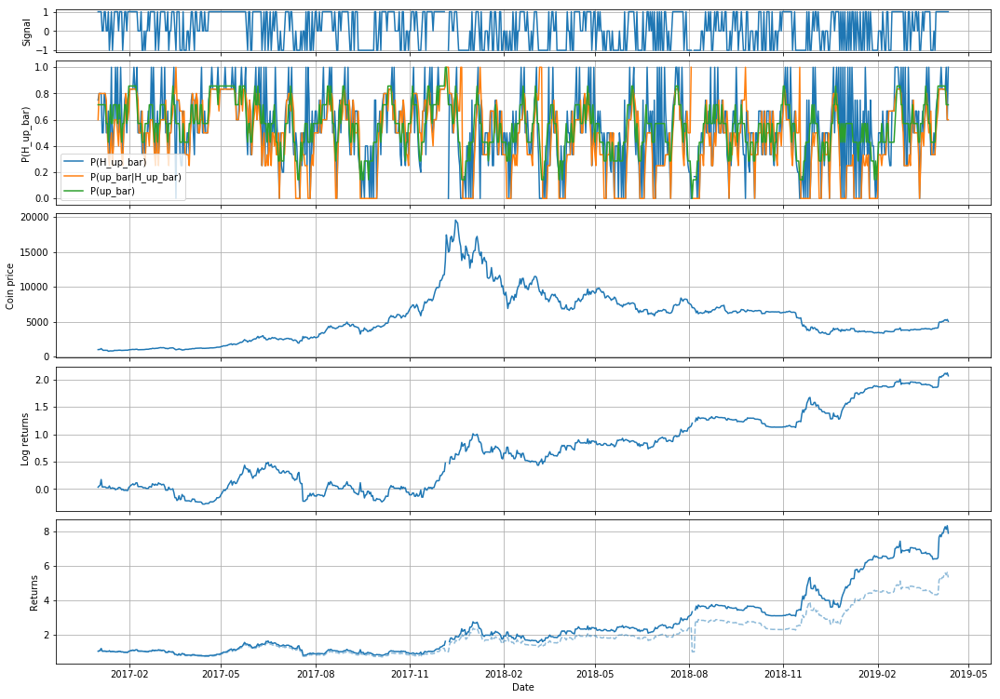

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[7]
	Returns: 7.898184584883611
	Returns after fees: 5.322722508502479
	SR: nan
	SR (after fees): 0.49773157797888956
	% bars right: 0.5130568356374808
	% bars in market: 0.7833935018050542
	Bars count: 831


In [5]:
# CELL 5
for history_bars in [365, 180, 90, 60, 30, 14, 7]:
    simulation_result = notebook_utils.simulate(const_bars_signal, df, history_bars)
    analysis_result = notebook_utils.graph_print_analyze_simulation_result(simulation_result, analysis_options)

In [6]:
# CELL 6
def const_bars_additive_signal(df, history_bars):
    df["pct_change"] = df["pct_change"].fillna(0)
    
    # Compute features for each bar
    df["up_bar"] = df["pct_change"] >= 0
    df["~up_bar"] = df["pct_change"] < 0
    # `hypotheses` contains the features we want to see in the next bar
    # For example, P(H_up_bar) is the probability of seeing `up_bar` feature in the next bar
    hypotheses = ["up_bar", "~up_bar"]
    # `features` are the bar features we update on
    features = ["up_bar", "~up_bar"]
    
    # Compute priors
    # For example, P(next_up_bar) = P(up_bar); note: this is debateable; we could start with a prior of 0.5
    # Here we're also using Additive smoothing
    for h in hypotheses:
        df[f"P(H_{h})"] = (df[f"{h}"].rolling(history_bars).sum() + 1) / (history_bars + 2)
    # Make sure we have priors for all hypotheses and they sum up to 1
    assert np.all([f"P(H_{h})" in df for h in hypotheses])
    assert np.all([np.isclose(np.sum([df.loc[i][f"P(H_{h})"] for h in hypotheses]), 1.0) for i in df.index[history_bars:]])
    
    for h in hypotheses:
        for f in features:
            # Updated P(H) = P(H) * P(f|H) / P(f)
            # Since we'll normalize later, we just have:
            # Updated P(H) = P(H) * P(f|H)
            # By definition of conditional probability: P(f|H) = P(f & H) / P(H)
            # To avoid peeking at future data, we reframe our probability slightly:
            # P(f|H) = P(f in last bar & H this bar) / P(H this bar)
            # We'll call "f in last bar" "prev_f"; and P(H this bar) just means probability of seeing the
            # hypothesis feature (from our `hypotheses` list) in the current bar
            df[f"prev_{f},{h}"] = np.where(df[f].shift(1) & df[h], 1, 0)
            df[f"P(prev_{f},{h})"] = (df[f"prev_{f},{h}"].rolling(history_bars).sum() + 1) / (history_bars + 2)
            df[f"P({h})"] = (df[f"{h}"].rolling(history_bars).sum() + 1) / (history_bars + 2)
            df[f"P({f}|H_{h})"] = df[f"P(prev_{f},{h})"] / df[f"P({h})"]
            # Where we see feature `f` in the current bar, we'll update our hypothesis of seeing `h` in the next bar
            df[f"P(H_{h})"] *= np.where(df[f"{f}"], df[f"P({f}|H_{h})"], 1)
    
    # Normalize
    df[f"total_H_sum"] = 0
    for h in hypotheses:
        df[f"total_H_sum"] += df[f"P(H_{h})"]
    for h in hypotheses:
        df[f"P(H_{h})"] /= df[f"total_H_sum"]
    # Make sure all posteriors now sum up to 1 (but ignore the first few values because of various boundary issues)
    assert np.all([np.isclose(np.sum([df.loc[i][f"P(H_{h})"] for h in hypotheses]), 1.0) for i in df.index[history_bars:]])

    df["strat_signal"] = np.sign(df["P(H_up_bar)"] - 0.5)
    return df

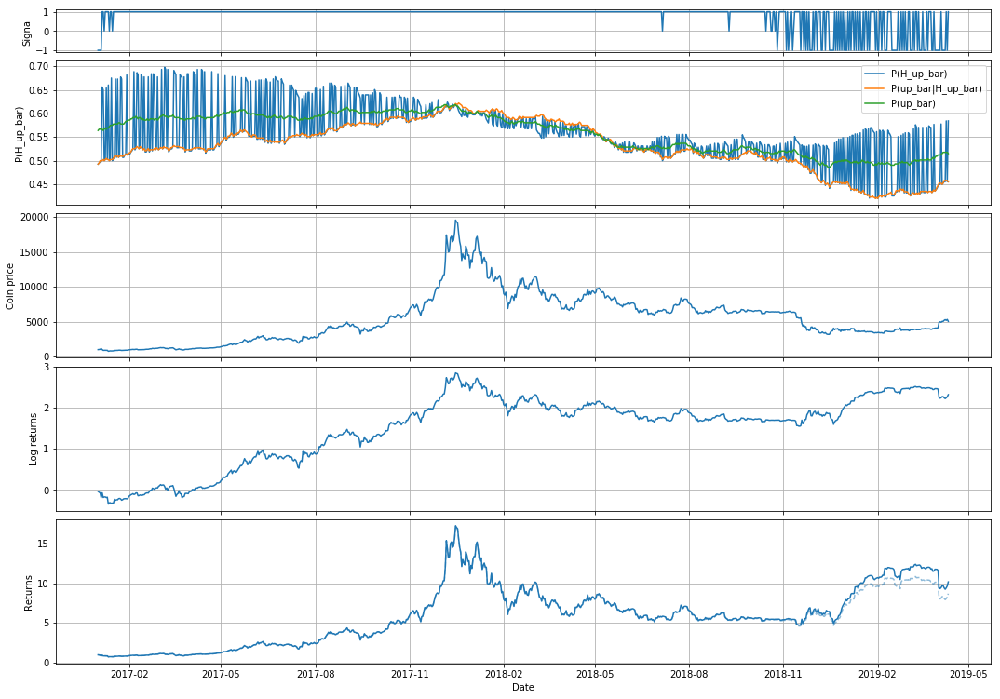

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[365]
	Returns: 10.169646005388238
	Returns after fees: 8.68717942661912
	SR: 1.1249471734333005
	SR (after fees): 1.048316887417207
	% bars right: 0.5543345543345544
	% bars in market: 0.9855595667870036
	Bars count: 831


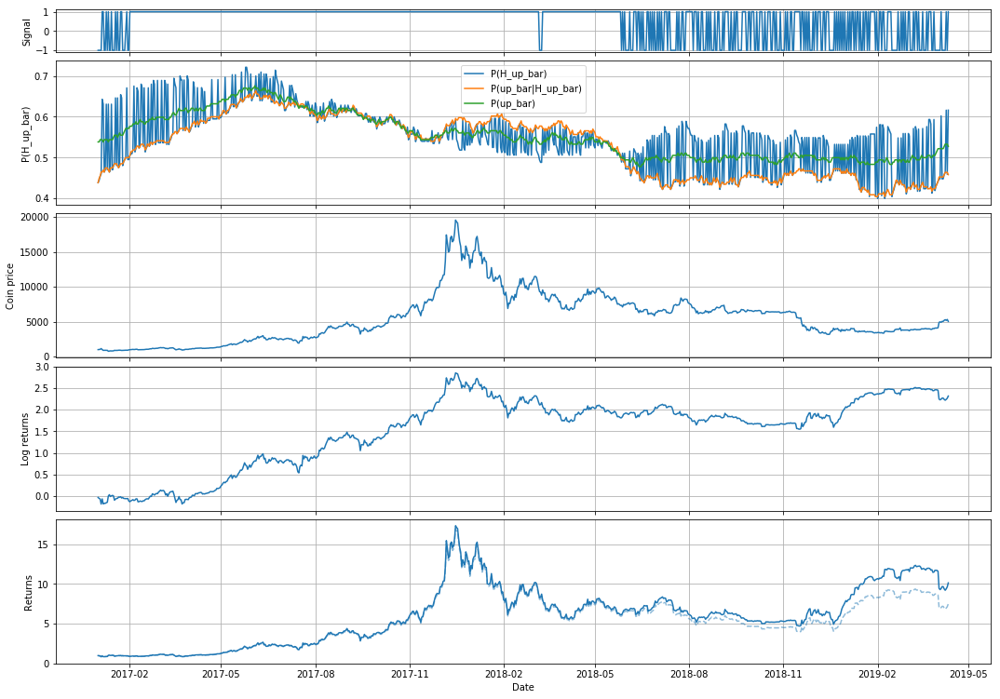

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[180]
	Returns: 10.139420734840414
	Returns after fees: 7.4993605036476705
	SR: 1.1225912477564717
	SR (after fees): 0.9749690984129173
	% bars right: 0.5614457831325301
	% bars in market: 0.9987966305655837
	Bars count: 831


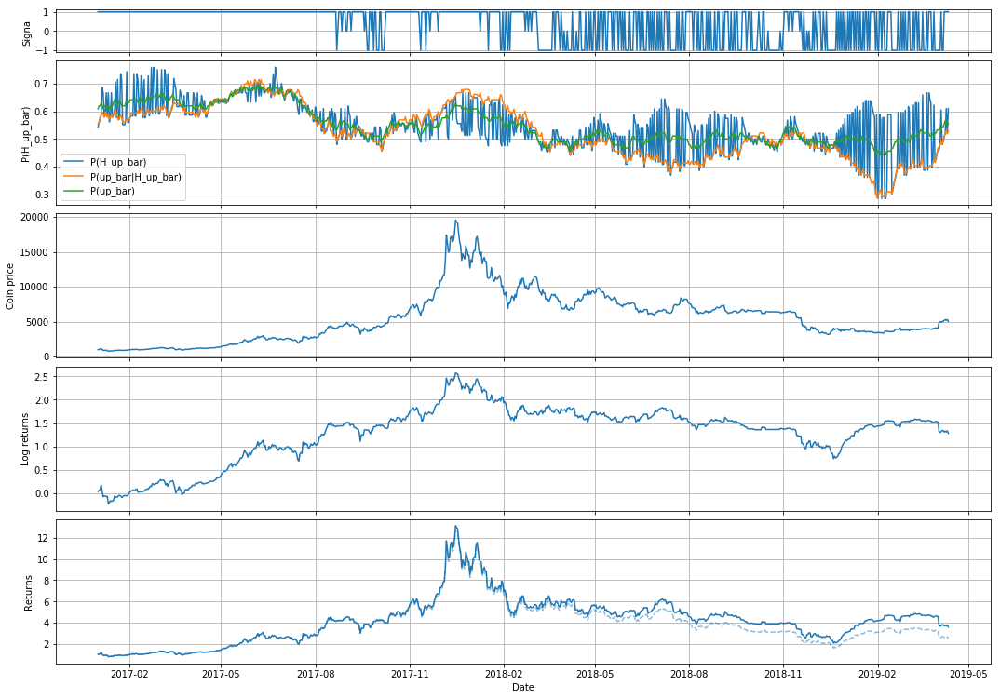

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[90]
	Returns: 3.5951973985215586
	Returns after fees: 2.534427493687441
	SR: 0.617489518063191
	SR (after fees): 0.4403922246678355
	% bars right: 0.5465994962216625
	% bars in market: 0.9554753309265944
	Bars count: 831


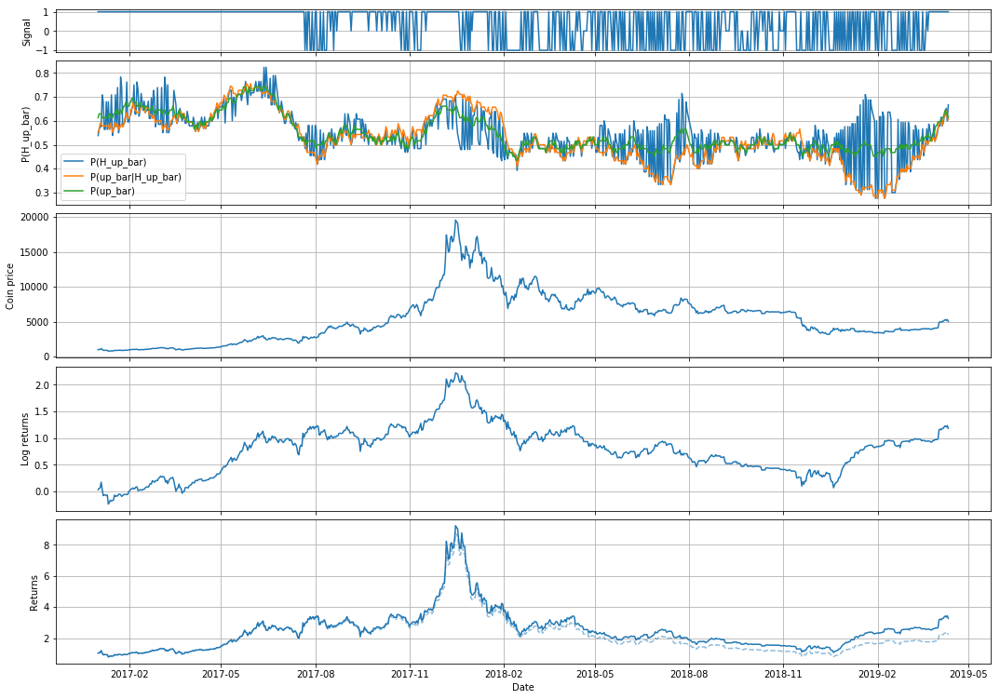

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[60]
	Returns: 3.2599631630019412
	Returns after fees: 2.226816415623004
	SR: 0.5613129803119372
	SR (after fees): 0.3701035982535018
	% bars right: 0.5535714285714286
	% bars in market: 0.9434416365824309
	Bars count: 831


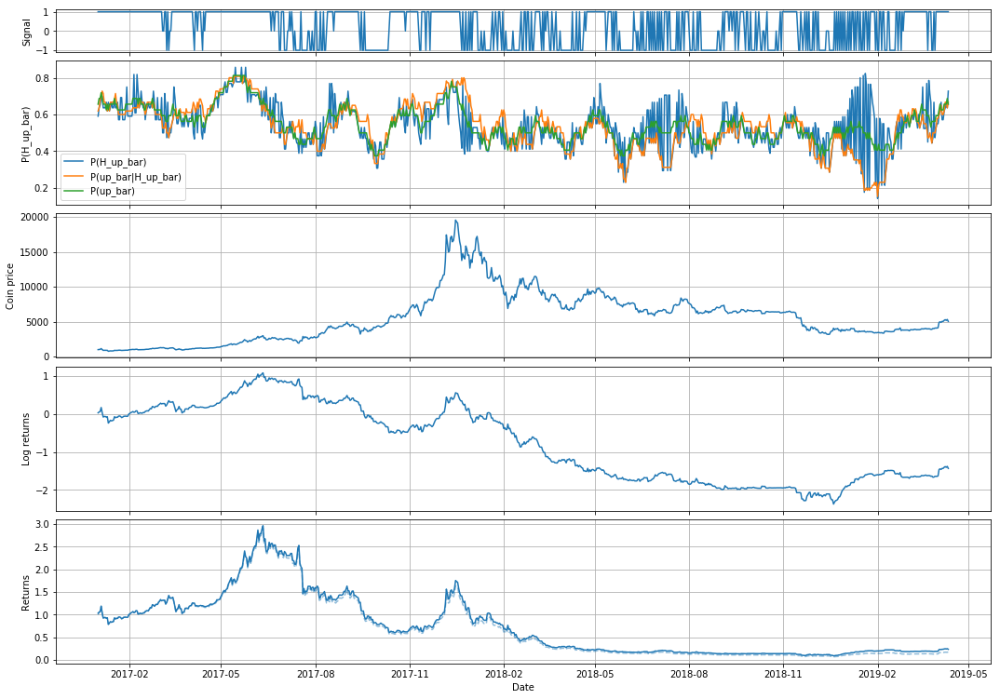

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[30]
	Returns: 0.2386174371939015
	Returns after fees: 0.16720627152731277
	SR: -0.7821730388702461
	SR (after fees): -0.9681724732119285
	% bars right: 0.5177398160315374
	% bars in market: 0.9157641395908543
	Bars count: 831


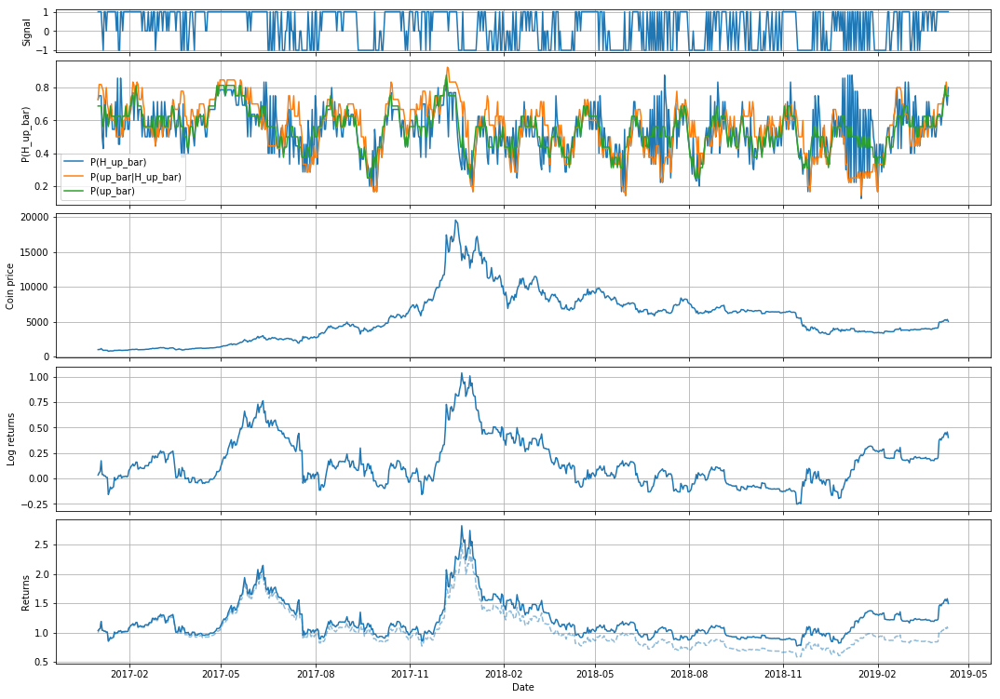

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[14]
	Returns: 1.495407037352549
	Returns after fees: 1.0384837116254064
	SR: 0.17922609587943678
	SR (after fees): -0.015749488425403416
	% bars right: 0.5227920227920227
	% bars in market: 0.8447653429602888
	Bars count: 831


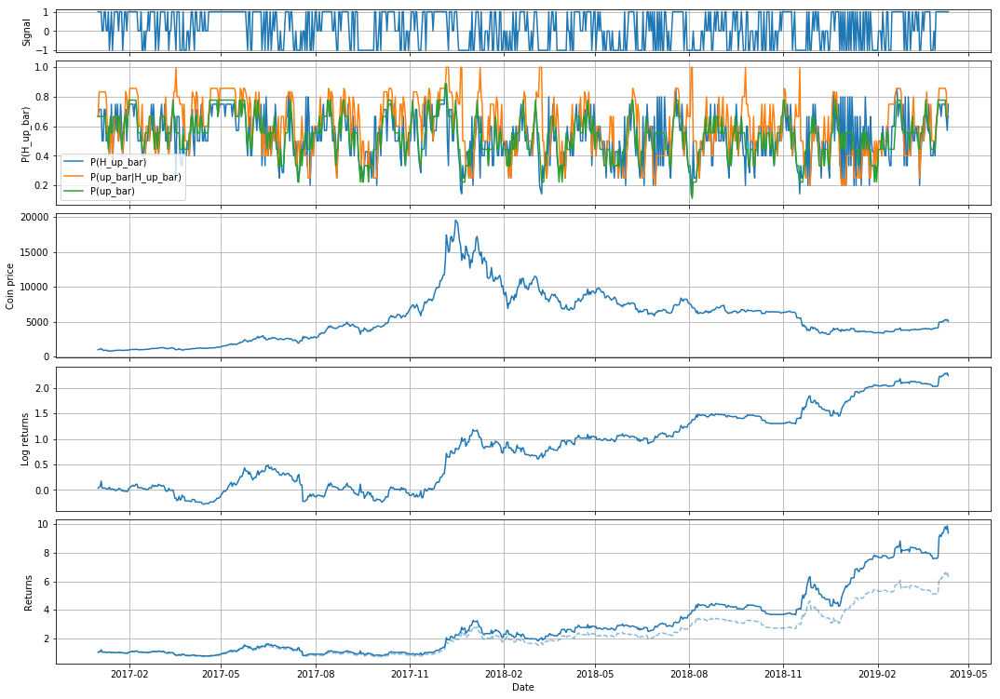

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[7]
	Returns: 9.37453755637881
	Returns after fees: 6.2987305068751125
	SR: 1.2175168656551707
	SR (after fees): 0.9937135268926105
	% bars right: 0.5161787365177196
	% bars in market: 0.7809867629362214
	Bars count: 831


In [7]:
# CELL 7
for history_bars in [365, 180, 90, 60, 30, 14, 7]:
    simulation_result = notebook_utils.simulate(const_bars_additive_signal, df, history_bars)
    analysis_result = notebook_utils.graph_print_analyze_simulation_result(simulation_result, analysis_options)

In [8]:
# CELL 8
def bet_sizing_signal(df, history_bars):
    df["pct_change"] = df["pct_change"].fillna(0)
    
    # Compute features for each bar
    df["up_bar"] = df["pct_change"] >= 0
    df["~up_bar"] = df["pct_change"] < 0
    # `hypotheses` contains the features we want to see in the next bar
    # For example, P(H_up_bar) is the probability of seeing `up_bar` feature in the next bar
    hypotheses = ["up_bar", "~up_bar"]
    # `features` are the bar features we update on
    features = ["up_bar", "~up_bar"]
    
    # Compute priors
    # For example, P(next_up_bar) = P(up_bar); note: this is debateable; we could start with a prior of 0.5
    # Here we're also using Additive smoothing
    for h in hypotheses:
        df[f"P(H_{h})"] = (df[f"{h}"].rolling(history_bars).sum() + 1) / (history_bars + 2)
    # Make sure we have priors for all hypotheses and they sum up to 1
    assert np.all([f"P(H_{h})" in df for h in hypotheses])
    assert np.all([np.isclose(np.sum([df.loc[i][f"P(H_{h})"] for h in hypotheses]), 1.0) for i in df.index[history_bars:]])
    
    for h in hypotheses:
        for f in features:
            # Updated P(H) = P(H) * P(f|H) / P(f)
            # Since we'll normalize later, we just have:
            # Updated P(H) = P(H) * P(f|H)
            # By definition of conditional probability: P(f|H) = P(f & H) / P(H)
            # To avoid peeking at future data, we reframe our probability slightly:
            # P(f|H) = P(f in last bar & H this bar) / P(H this bar)
            # We'll call "f in last bar" "prev_f"; and P(H this bar) just means probability of seeing the
            # hypothesis feature (from our `hypotheses` list) in the current bar
            df[f"prev_{f},{h}"] = np.where(df[f].shift(1) & df[h], 1, 0)
            df[f"P(prev_{f},{h})"] = (df[f"prev_{f},{h}"].rolling(history_bars).sum() + 1) / (history_bars + 2)
            df[f"P({h})"] = (df[f"{h}"].rolling(history_bars).sum() + 1) / (history_bars + 2)
            df[f"P({f}|H_{h})"] = df[f"P(prev_{f},{h})"] / df[f"P({h})"]
            # Where we see feature `f` in the current bar, we'll update our hypothesis of seeing `h` in the next bar
            df[f"P(H_{h})"] *= np.where(df[f"{f}"], df[f"P({f}|H_{h})"], 1)
    
    # Normalize
    df[f"total_H_sum"] = 0
    for h in hypotheses:
        df[f"total_H_sum"] += df[f"P(H_{h})"]
    for h in hypotheses:
        df[f"P(H_{h})"] /= df[f"total_H_sum"]
    # Make sure all posteriors now sum up to 1 (but ignore the first few values because of various boundary issues)
    assert np.all([np.isclose(np.sum([df.loc[i][f"P(H_{h})"] for h in hypotheses]), 1.0) for i in df.index[history_bars:]])

    df["strat_signal"] = 2 * (df["P(H_up_bar)"] - 0.5)
    return df

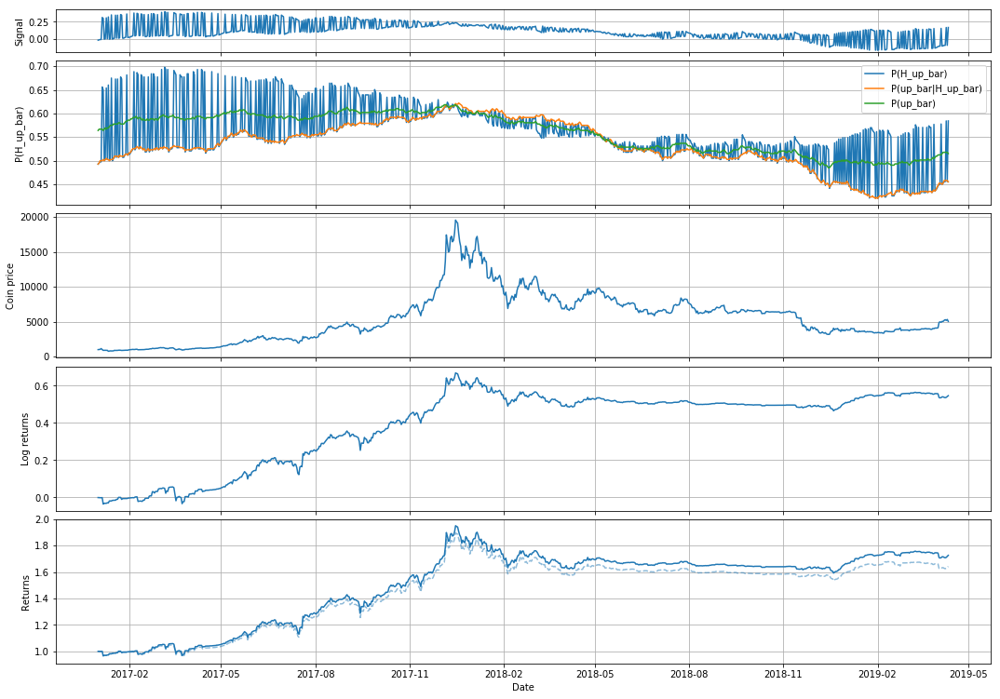

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[365]
	Returns: 1.7265661897937237
	Returns after fees: 1.6423529997644863
	SR: 1.2512459573741348
	SR (after fees): 1.123464453027029
	% bars right: 0.5543345543345544
	% bars in market: 0.9855595667870036
	Bars count: 831


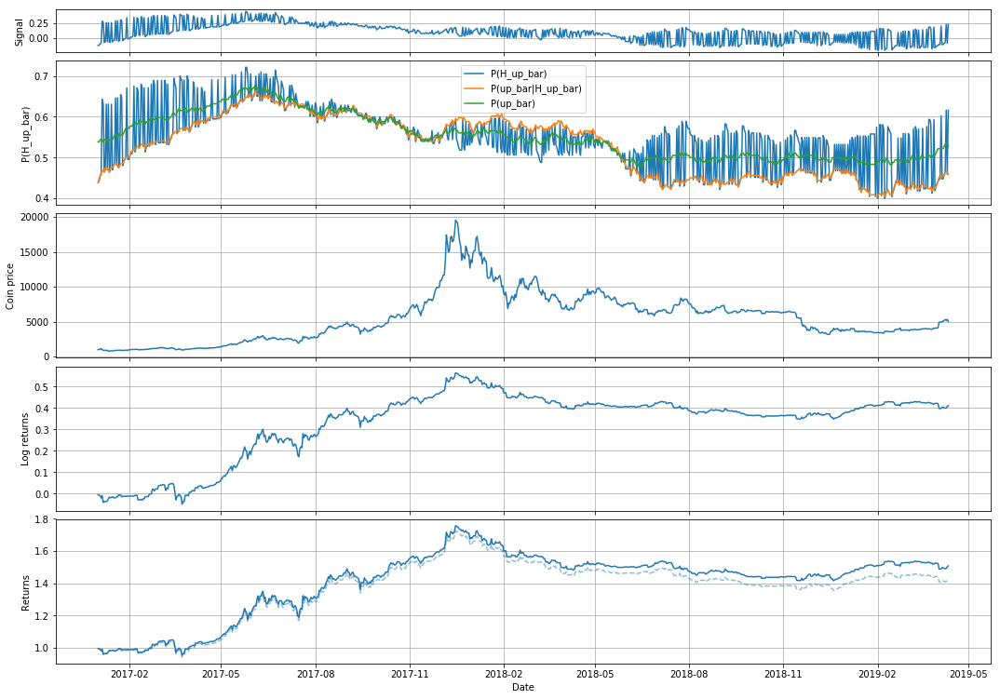

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[180]
	Returns: 1.5081047244788022
	Returns after fees: 1.4251128464999876
	SR: 0.9652504479540506
	SR (after fees): 0.8076064961804559
	% bars right: 0.5614457831325301
	% bars in market: 0.9987966305655837
	Bars count: 831


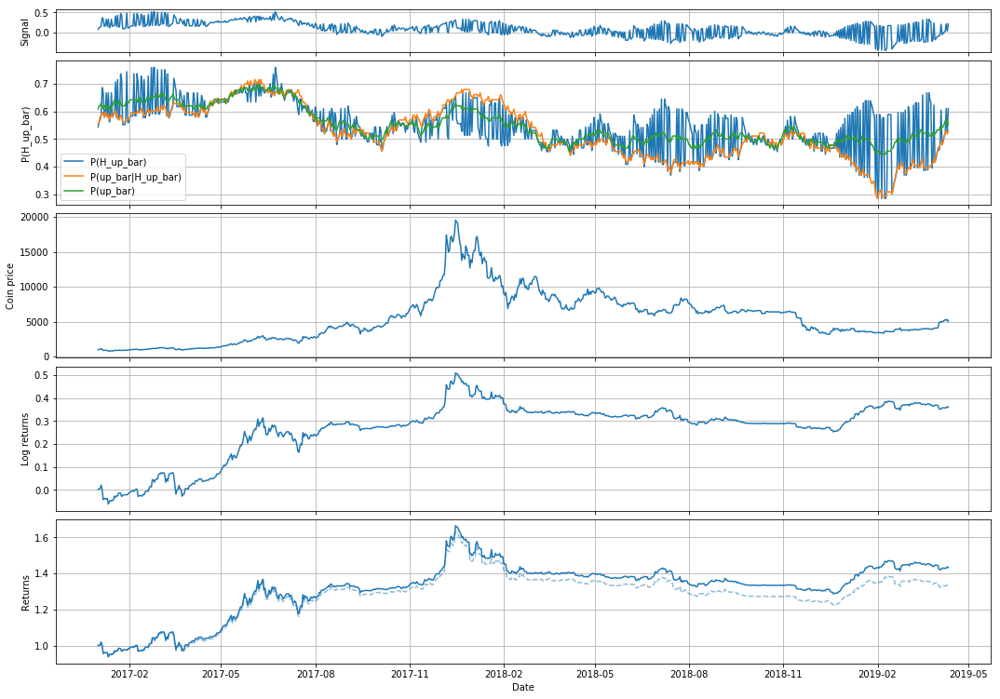

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[90]
	Returns: 1.434438898542465
	Returns after fees: 1.335996530468257
	SR: 0.767029704484359
	SR (after fees): 0.582264430300842
	% bars right: 0.5465994962216625
	% bars in market: 0.9554753309265944
	Bars count: 831


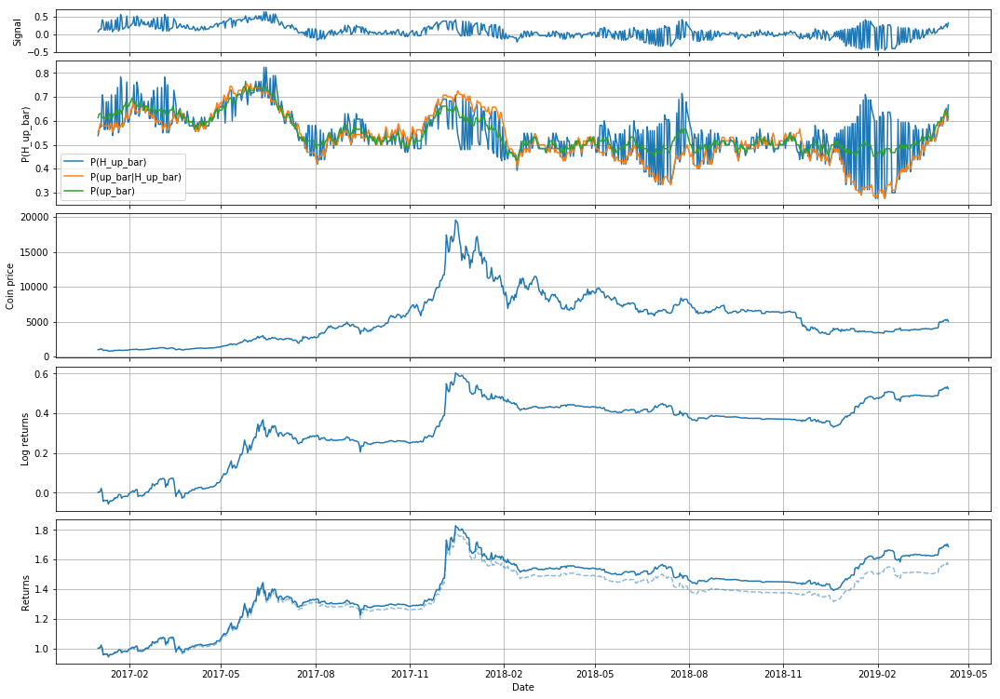

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[60]
	Returns: 1.6878456764797618
	Returns after fees: 1.5625399841351524
	SR: 1.0328704940089861
	SR (after fees): 0.8593354067538742
	% bars right: 0.5535714285714286
	% bars in market: 0.9434416365824309
	Bars count: 831


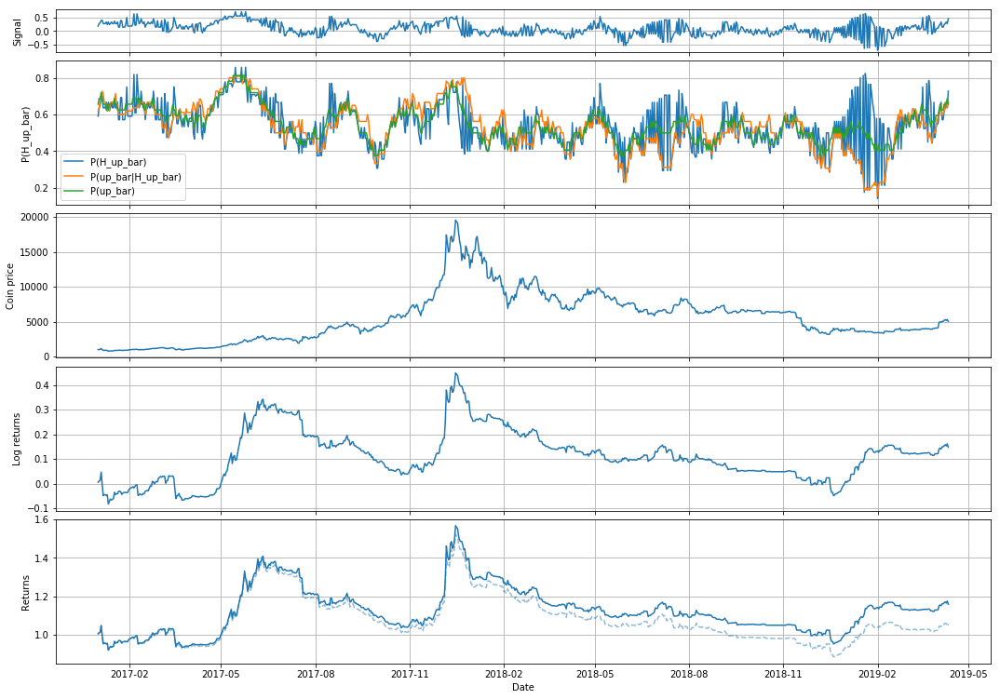

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[30]
	Returns: 1.1588338131729874
	Returns after fees: 1.0486283753995775
	SR: 0.15725770301513314
	SR (after fees): -0.03877310123840449
	% bars right: 0.5177398160315374
	% bars in market: 0.9157641395908543
	Bars count: 831


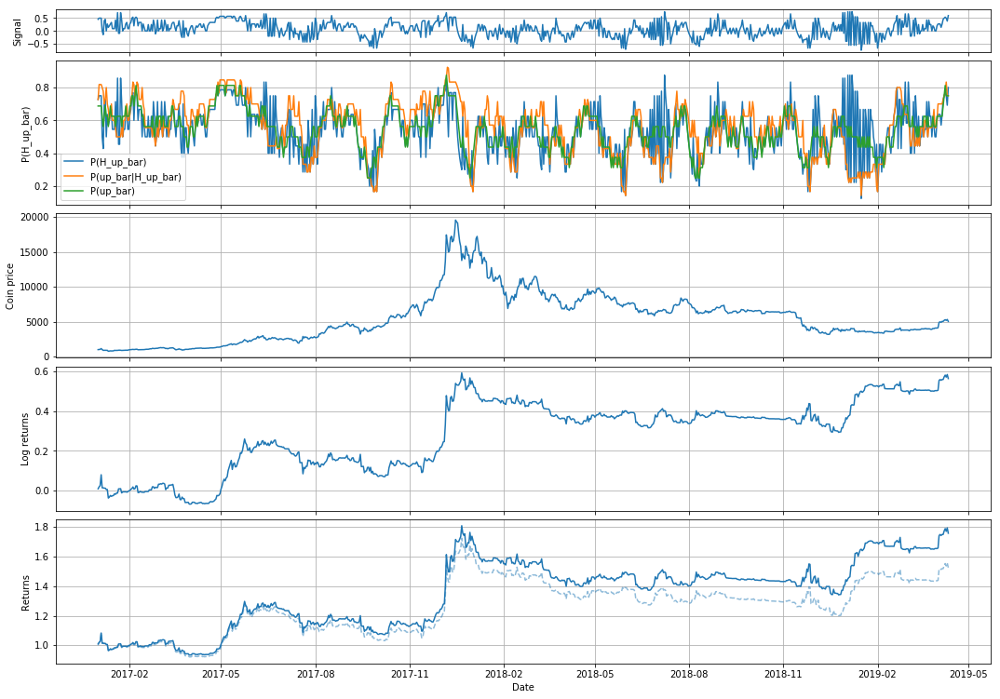

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[14]
	Returns: 1.7577113143472758
	Returns after fees: 1.5251027211585362
	SR: 0.7883471720823647
	SR (after fees): 0.5633140048394958
	% bars right: 0.5227920227920227
	% bars in market: 0.8447653429602888
	Bars count: 831


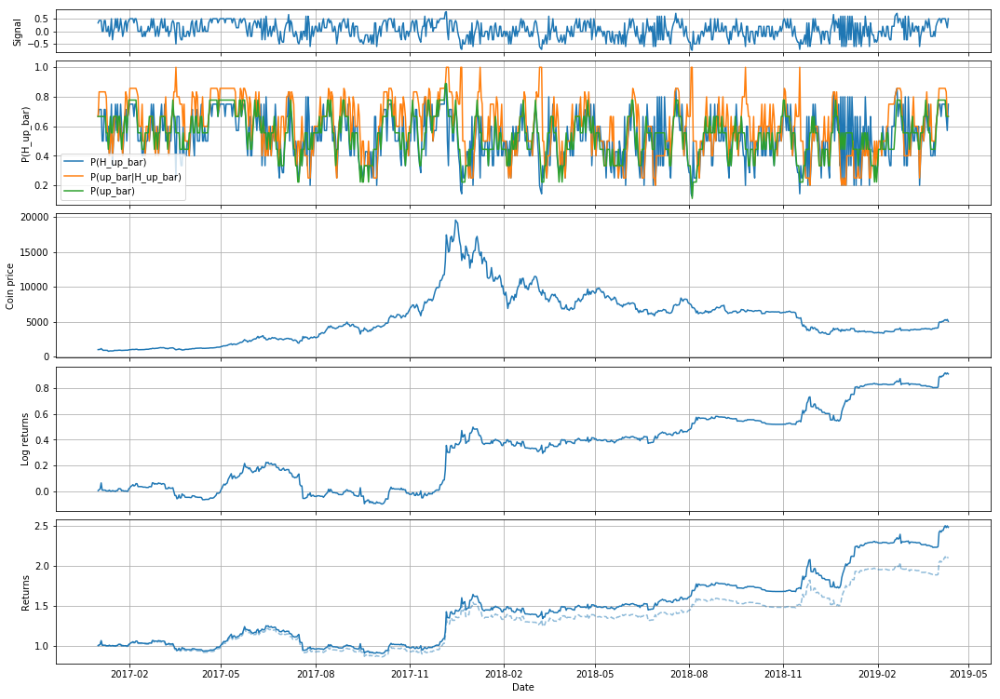

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[7]
	Returns: 2.4788832895261264
	Returns after fees: 2.0943186636311846
	SR: 1.1417883775062876
	SR (after fees): 0.9131853698529843
	% bars right: 0.5161787365177196
	% bars in market: 0.7809867629362214
	Bars count: 831


In [9]:
# CELL 9
for history_bars in [365, 180, 90, 60, 30, 14, 7]:
    simulation_result = notebook_utils.simulate(bet_sizing_signal, df, history_bars)
    analysis_result = notebook_utils.graph_print_analyze_simulation_result(simulation_result, analysis_options)

In [10]:
# CELL 10
def ignorant_prior_signal(df, history_bars):
    df["pct_change"] = df["pct_change"].fillna(0)
    
    # Compute features for each bar
    df["up_bar"] = df["pct_change"] >= 0
    df["~up_bar"] = df["pct_change"] < 0
    # `hypotheses` contains the features we want to see in the next bar
    # For example, P(H_up_bar) is the probability of seeing `up_bar` feature in the next bar
    hypotheses = ["up_bar", "~up_bar"]
    # `features` are the bar features we update on
    features = ["up_bar", "~up_bar"]
    
    # Compute ignorant priors
    for h in hypotheses:
        df[f"P(H_{h})"] = 1 / len(hypotheses)
    # Make sure we have priors for all hypotheses and they sum up to 1
    assert np.all([f"P(H_{h})" in df for h in hypotheses])
    assert np.all([np.isclose(np.sum([df.loc[i][f"P(H_{h})"] for h in hypotheses]), 1.0) for i in df.index[history_bars:]])
    
    for h in hypotheses:
        for f in features:
            # Updated P(H) = P(H) * P(f|H) / P(f)
            # Since we'll normalize later, we just have:
            # Updated P(H) = P(H) * P(f|H)
            # By definition of conditional probability: P(f|H) = P(f & H) / P(H)
            # To avoid peeking at future data, we reframe our probability slightly:
            # P(f|H) = P(f in last bar & H this bar) / P(H this bar)
            # We'll call "f in last bar" "prev_f"; and P(H this bar) just means probability of seeing the
            # hypothesis feature (from our `hypotheses` list) in the current bar
            df[f"prev_{f},{h}"] = np.where(df[f].shift(1) & df[h], 1, 0)
            df[f"P(prev_{f},{h})"] = (df[f"prev_{f},{h}"].rolling(history_bars).sum() + 1) / (history_bars + 2)
            df[f"P({h})"] = (df[f"{h}"].rolling(history_bars).sum() + 1) / (history_bars + 2)
            df[f"P({f}|H_{h})"] = df[f"P(prev_{f},{h})"] / df[f"P({h})"]
            # Where we see feature `f` in the current bar, we'll update our hypothesis of seeing `h` in the next bar
            df[f"P(H_{h})"] *= np.where(df[f"{f}"], df[f"P({f}|H_{h})"], 1)
    
    # Normalize
    df[f"total_H_sum"] = 0
    for h in hypotheses:
        df[f"total_H_sum"] += df[f"P(H_{h})"]
    for h in hypotheses:
        df[f"P(H_{h})"] /= df[f"total_H_sum"]
    # Make sure all posteriors now sum up to 1 (but ignore the first few values because of various boundary issues)
    assert np.all([np.isclose(np.sum([df.loc[i][f"P(H_{h})"] for h in hypotheses]), 1.0) for i in df.index[history_bars:]])

    df["strat_signal"] = np.sign(df["P(H_up_bar)"] - 0.5)
    return df

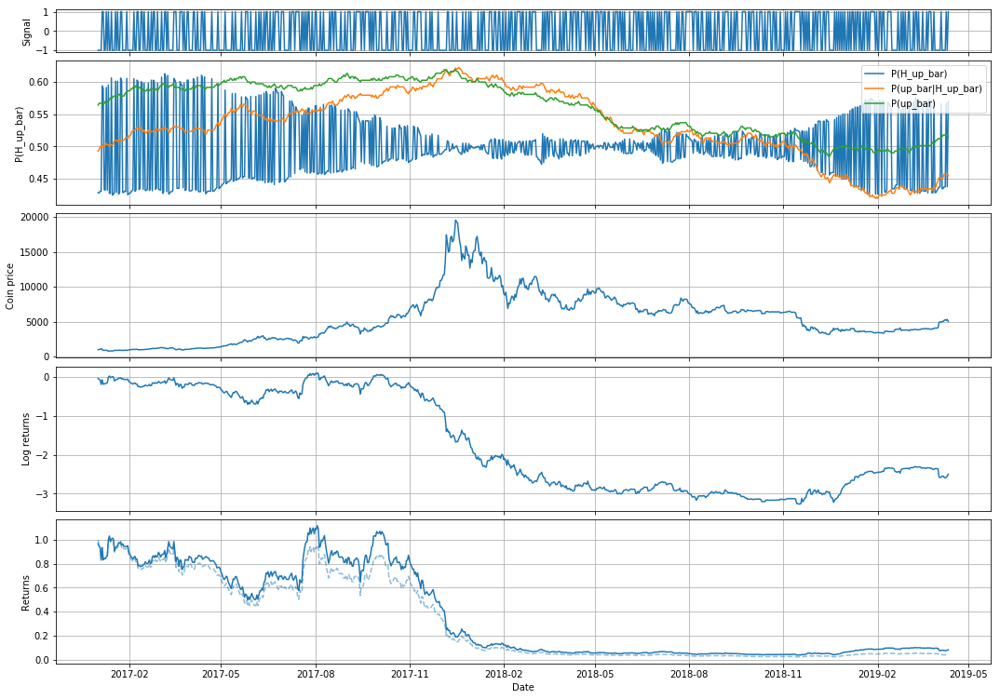

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[365]
	Returns: 0.08211808675468334
	Returns after fees: 0.042880389892541115
	SR: -1.2741489685580598
	SR (after fees): -1.6068191990893215
	% bars right: 0.50661853188929
	% bars in market: 1.0
	Bars count: 831


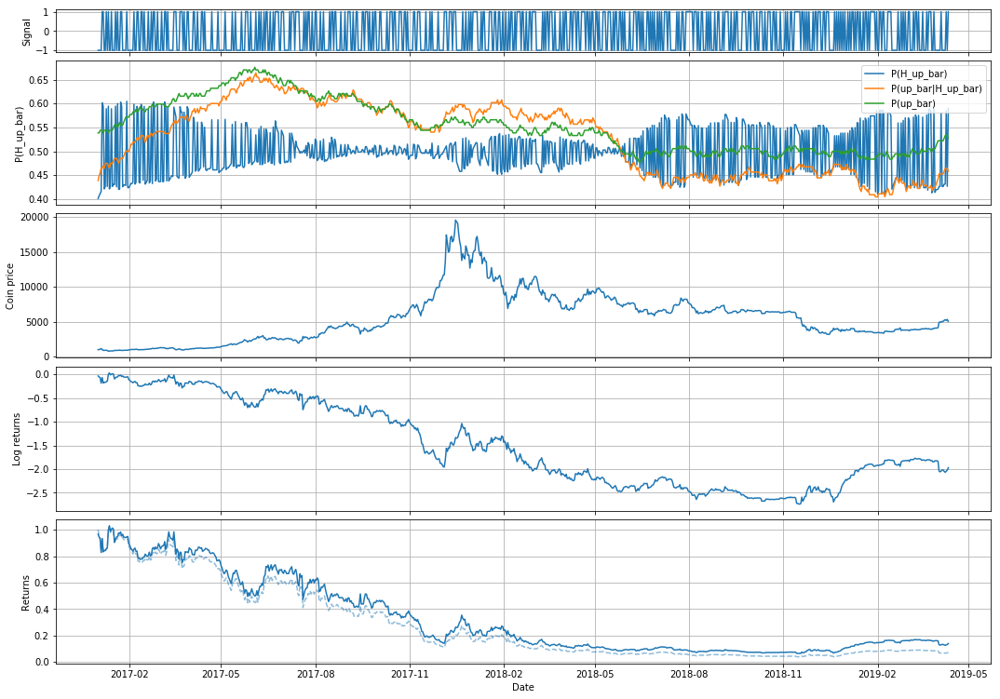

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[180]
	Returns: 0.13936346265924857
	Returns after fees: 0.0729914857565699
	SR: -1.0114442778150947
	SR (after fees): -1.338458402567919
	% bars right: 0.5030084235860409
	% bars in market: 1.0
	Bars count: 831


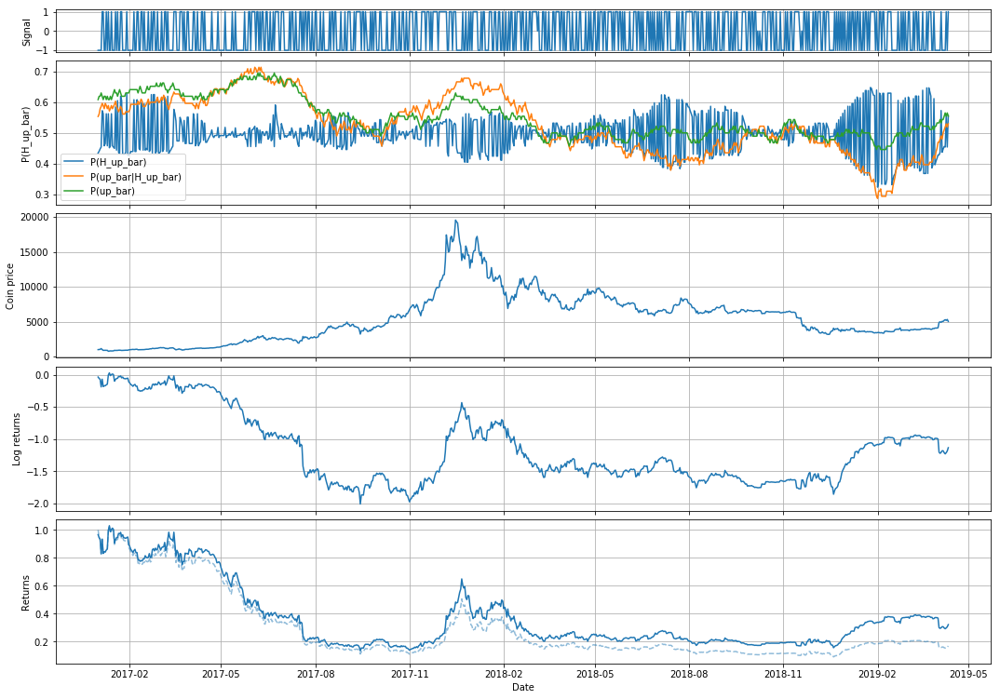

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[90]
	Returns: 0.3218564870794224
	Returns after fees: 0.16857203993100003
	SR: -0.5990324980648054
	SR (after fees): -0.9250539986127018
	% bars right: 0.5151515151515151
	% bars in market: 0.9927797833935018
	Bars count: 831


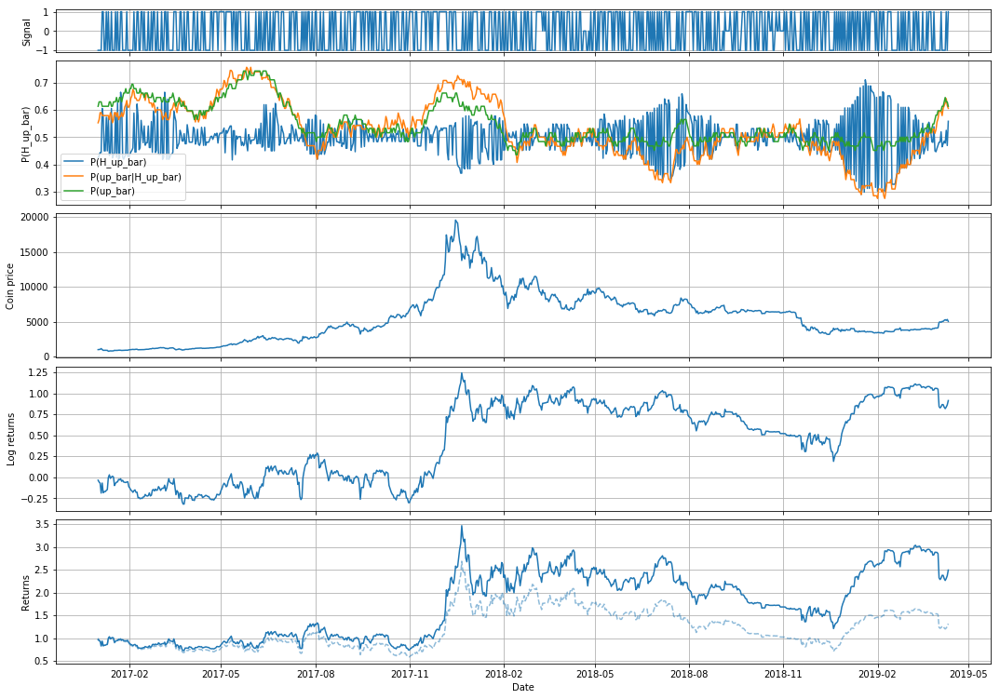

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[60]
	Returns: 2.4925237488434684
	Returns after fees: 1.3152884642877791
	SR: 0.4246580279049965
	SR (after fees): 0.10433708175329554
	% bars right: 0.5235732009925558
	% bars in market: 0.9699157641395909
	Bars count: 831


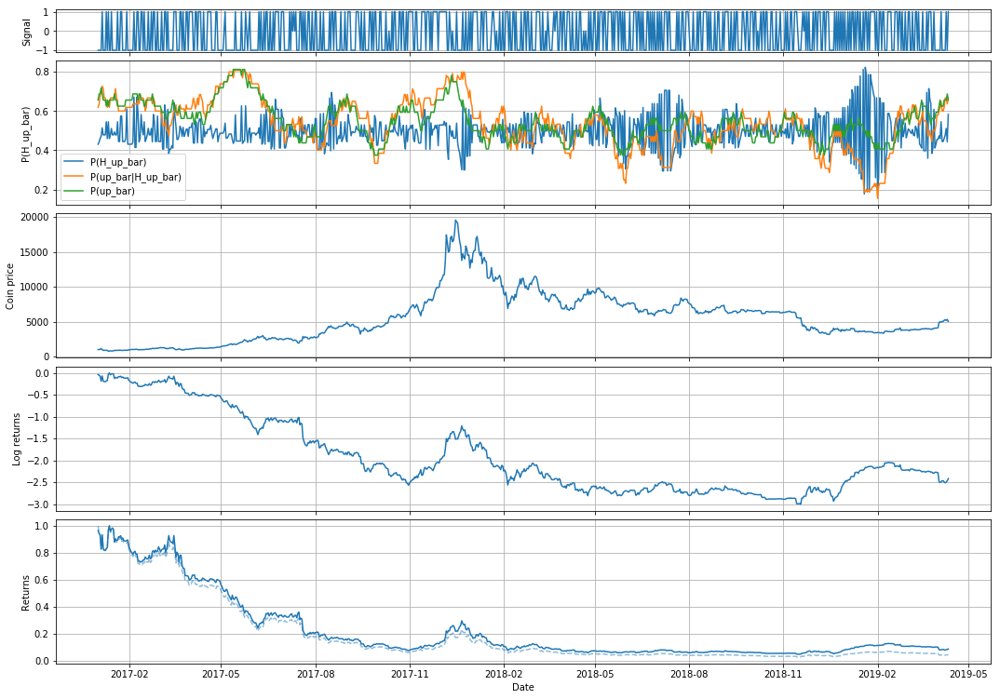

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[30]
	Returns: 0.08916047956836284
	Returns after fees: 0.04719081460962096
	SR: -1.256916222048297
	SR (after fees): -1.5855983111950096
	% bars right: 0.4857142857142857
	% bars in market: 0.9687123947051745
	Bars count: 831


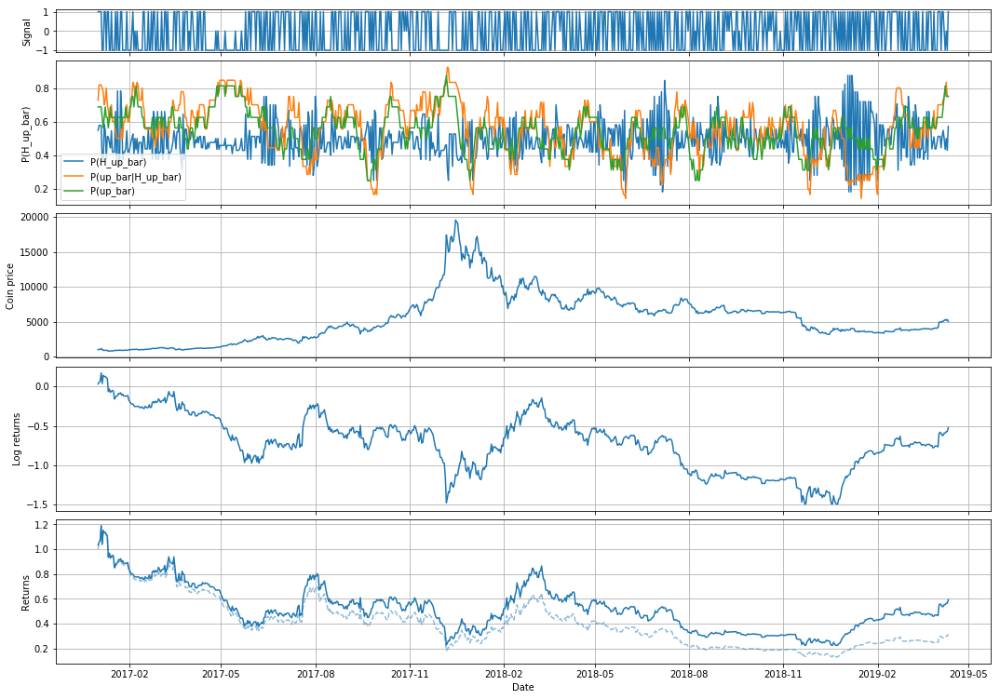

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[14]
	Returns: 0.5931492448742212
	Returns after fees: 0.31488533329708623
	SR: -0.2966395228725563
	SR (after fees): -0.6175151748627672
	% bars right: 0.489171974522293
	% bars in market: 0.9446450060168472
	Bars count: 831


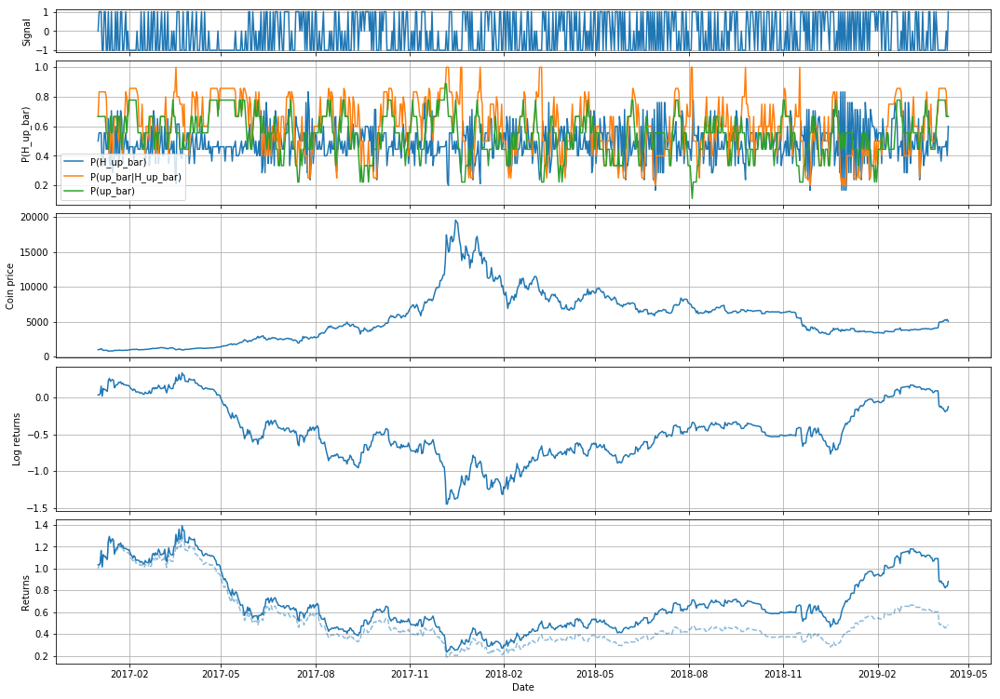

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[7]
	Returns: 0.8820034827058667
	Returns after fees: 0.48576370357857684
	SR: -0.10356946814551565
	SR (after fees): -0.4260681987123502
	% bars right: 0.4749661705006766
	% bars in market: 0.8892900120336944
	Bars count: 831


In [11]:
# CELL 11
for history_bars in [365, 180, 90, 60, 30, 14, 7]:
    simulation_result = notebook_utils.simulate(ignorant_prior_signal, df, history_bars)
    analysis_result = notebook_utils.graph_print_analyze_simulation_result(simulation_result, analysis_options)

In [12]:
# CELL 11
def naive_bayes_signal(df, history_bars, use_ignorant_priors, use_bet_sizing, features):
    df["pct_change"] = df["pct_change"].fillna(0)
    
    for f, get_feature_column_fn in features.items():
        df[f"{f}"] = get_feature_column_fn(df)
        # Compute features necessary for hypotheses
    df["up_bar"] = df["pct_change"] >= 0
    df["~up_bar"] = df["pct_change"] < 0
    # `hypotheses` contains the features we want to see in the next bar
    # For example, P(H_up_bar) is the probability of seeing `up_bar` feature in the next bar
    hypotheses = ["up_bar", "~up_bar"]
    
    # Compute priors
    for h in hypotheses:
        if use_ignorant_priors:
            # Compute ignorant priors
            df[f"P(H_{h})"] = 1 / len(hypotheses)
        else:
            # For example, P(next_up_bar) = P(up_bar); note: this is debateable; we could start with a prior of 0.5
            # Here we're also using Additive smoothing
            df[f"P(H_{h})"] = (df[f"{h}"].rolling(history_bars).sum() + 1) / (history_bars + 2)
    # Make sure we have priors for all hypotheses and they sum up to 1
    assert np.all([f"P(H_{h})" in df for h in hypotheses])
    assert np.all([np.isclose(np.sum([df.loc[i][f"P(H_{h})"] for h in hypotheses]), 1.0) for i in df.index[history_bars:]])
    
    for h in hypotheses:
        for f in features.keys():
            # Updated P(H) = P(H) * P(f|H) / P(f)
            # Since we'll normalize later, we just have:
            # Updated P(H) = P(H) * P(f|H)
            # By definition of conditional probability: P(f|H) = P(f & H) / P(H)
            # To avoid peeking at future data, we reframe our probability slightly:
            # P(f|H) = P(f in last bar & H this bar) / P(H this bar)
            # We'll call "f in last bar" "prev_f"; and P(H this bar) just means probability of seeing the
            # hypothesis feature (from our `hypotheses` list) in the current bar
            df[f"prev_{f},{h}"] = np.where(df[f].shift(1) & df[h], 1, 0)
            df[f"P(prev_{f},{h})"] = (df[f"prev_{f},{h}"].rolling(history_bars).sum() + 1) / (history_bars + 2)
            df[f"P({h})"] = (df[f"{h}"].rolling(history_bars).sum() + 1) / (history_bars + 2)
            df[f"P({f}|H_{h})"] = df[f"P(prev_{f},{h})"] / df[f"P({h})"]
            # Where we see feature `f` in the current bar, we'll update our hypothesis of seeing `h` in the next bar
            df[f"P(H_{h})"] *= np.where(df[f"{f}"], df[f"P({f}|H_{h})"], 1)
    
    # Normalize
    df[f"total_H_sum"] = 0
    for h in hypotheses:
        df[f"total_H_sum"] += df[f"P(H_{h})"]
    for h in hypotheses:
        df[f"P(H_{h})"] /= df[f"total_H_sum"]
    # Make sure all posteriors now sum up to 1 (but ignore the first few values because of various boundary issues)
    assert np.all([np.isclose(np.sum([df.loc[i][f"P(H_{h})"] for h in hypotheses]), 1.0) for i in df.index[history_bars:]])

    if use_bet_sizing:
        df["strat_signal"] = 2 * (df["P(H_up_bar)"] - 0.5)
    else:
        df["strat_signal"] = np.sign(df["P(H_up_bar)"] - 0.5)
    return df

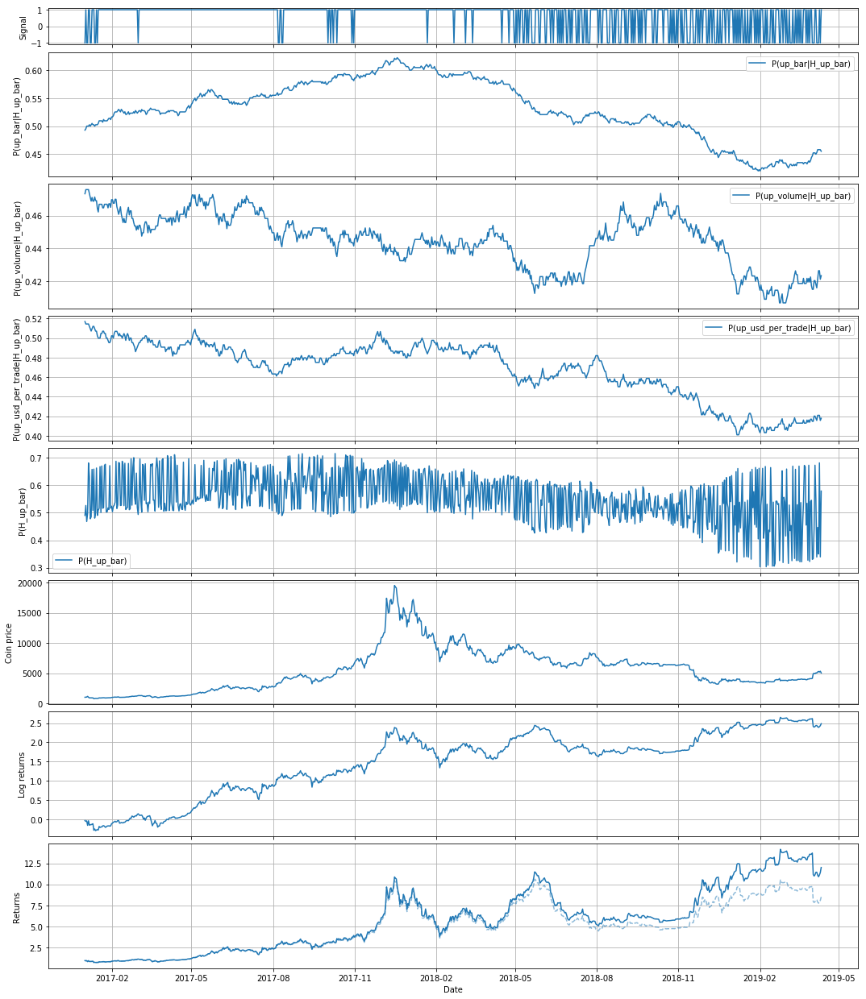

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[365, False, False]
	Returns: 12.009437004955098
	Returns after fees: 8.516997570119392
	SR: 1.2076409160781345
	SR (after fees): 1.0365100107858845
	% bars right: 0.5571600481347774
	% bars in market: 1.0
	Bars count: 831


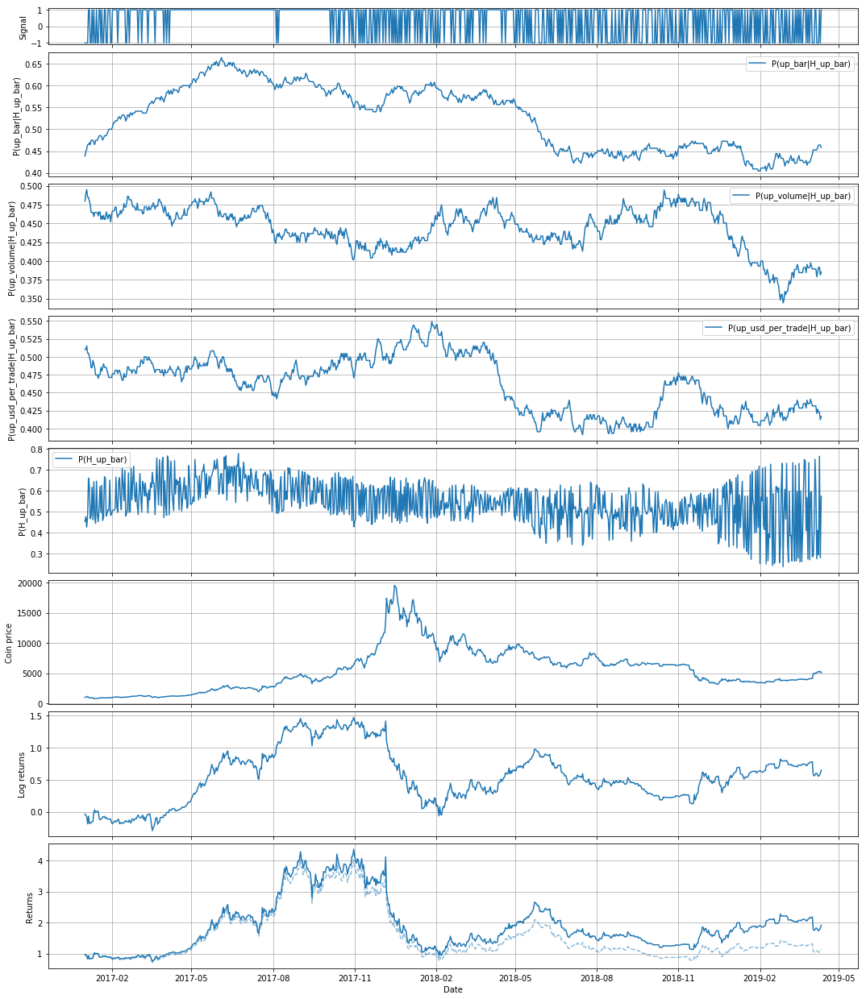

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[180, False, False]
	Returns: 1.9140469184433009
	Returns after fees: 1.1474337161303283
	SR: 0.2893850871175781
	SR (after fees): 0.03498091450680904
	% bars right: 0.53309265944645
	% bars in market: 1.0
	Bars count: 831


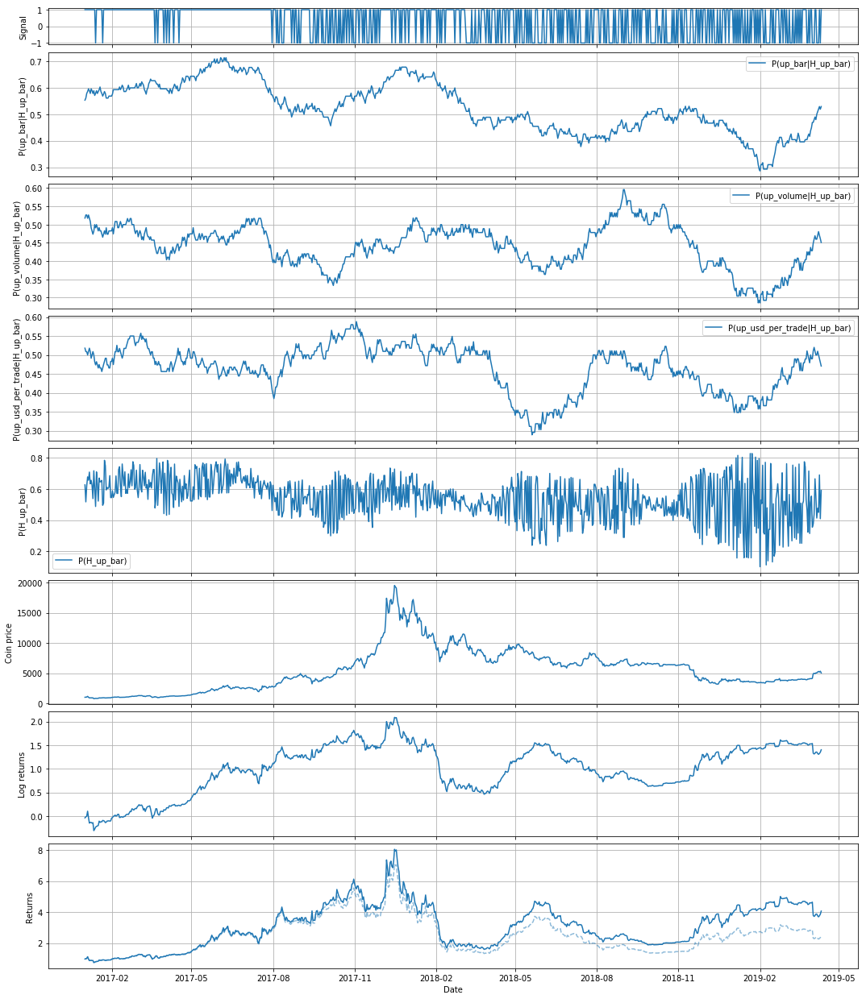

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[90, False, False]
	Returns: 4.0638670865356605
	Returns after fees: 2.4730413871665538
	SR: 0.668764541225959
	SR (after fees): 0.4205365984754891
	% bars right: 0.559322033898305
	% bars in market: 0.9939831528279182
	Bars count: 831


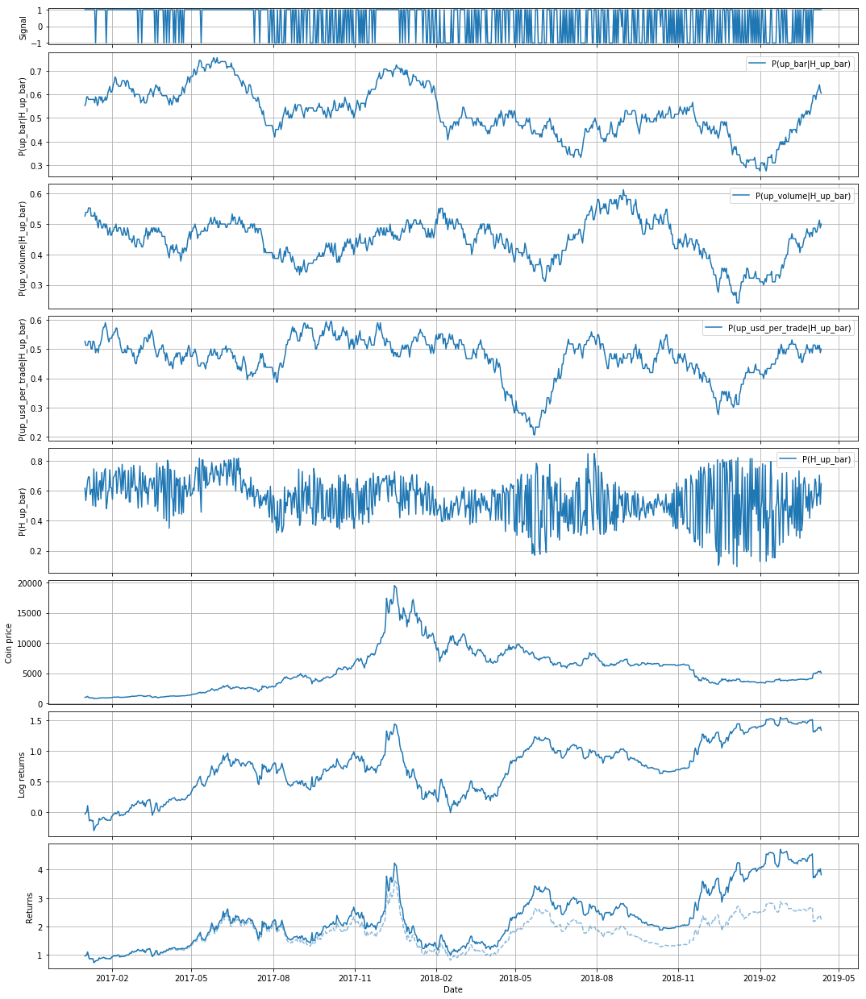

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[60, False, False]
	Returns: 3.8224506566937735
	Returns after fees: 2.247216918476316
	SR: 0.634288289279999
	SR (after fees): 0.37045782345852324
	% bars right: 0.5507246376811594
	% bars in market: 0.9963898916967509
	Bars count: 831


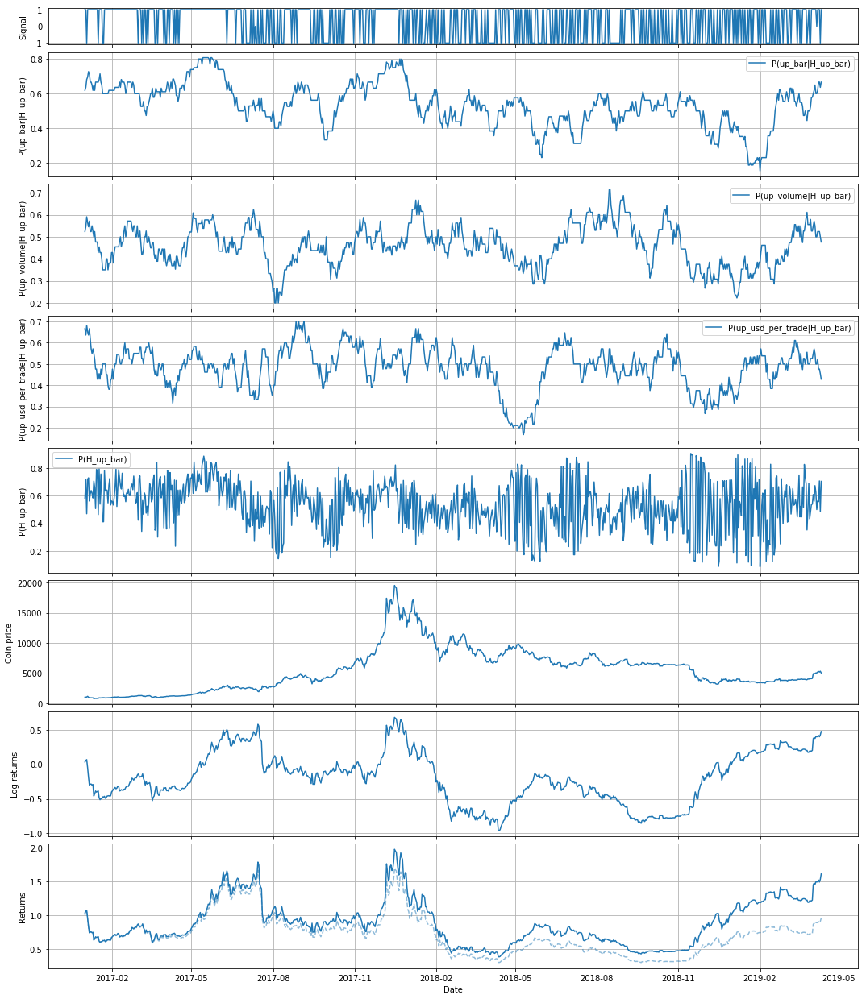

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[30, False, False]
	Returns: 1.6101521302481325
	Returns after fees: 0.955168816842946
	SR: 0.20408108961983326
	SR (after fees): -0.056462585662731275
	% bars right: 0.5254237288135594
	% bars in market: 0.9939831528279182
	Bars count: 831


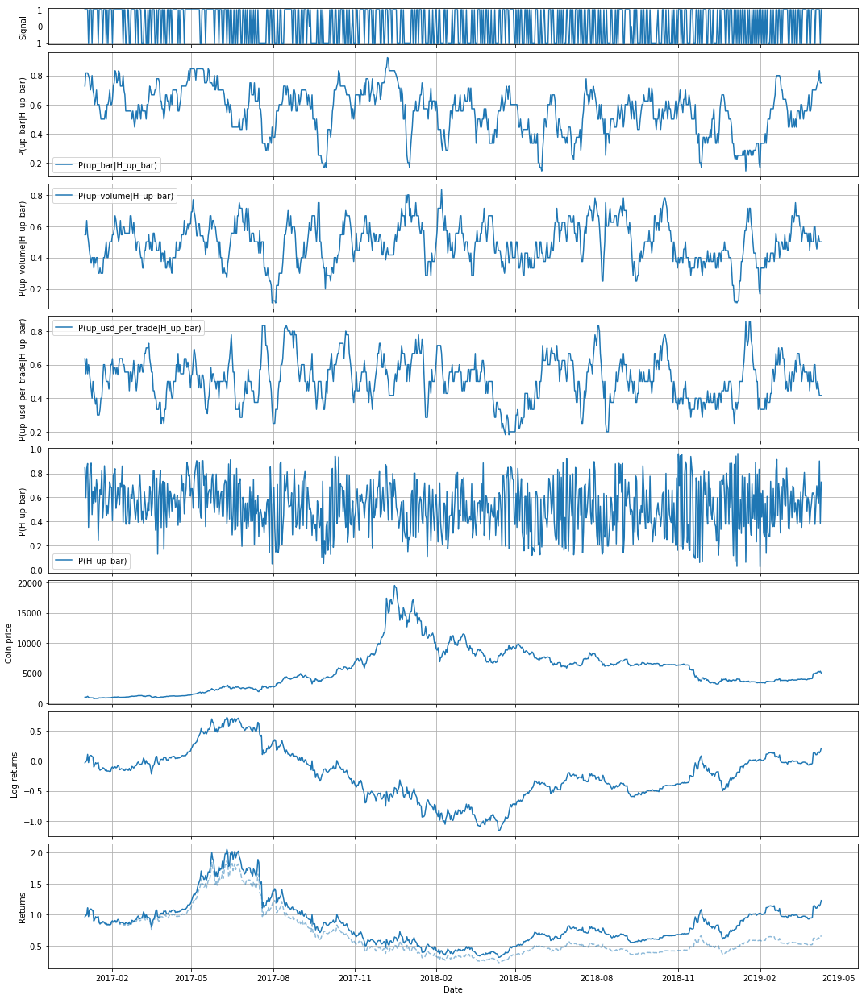

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[14, False, False]
	Returns: 1.2291884591543087
	Returns after fees: 0.6643962283366176
	SR: 0.06911212845929297
	SR (after fees): -0.23701779345392296
	% bars right: 0.5102781136638452
	% bars in market: 0.9951865222623345
	Bars count: 831


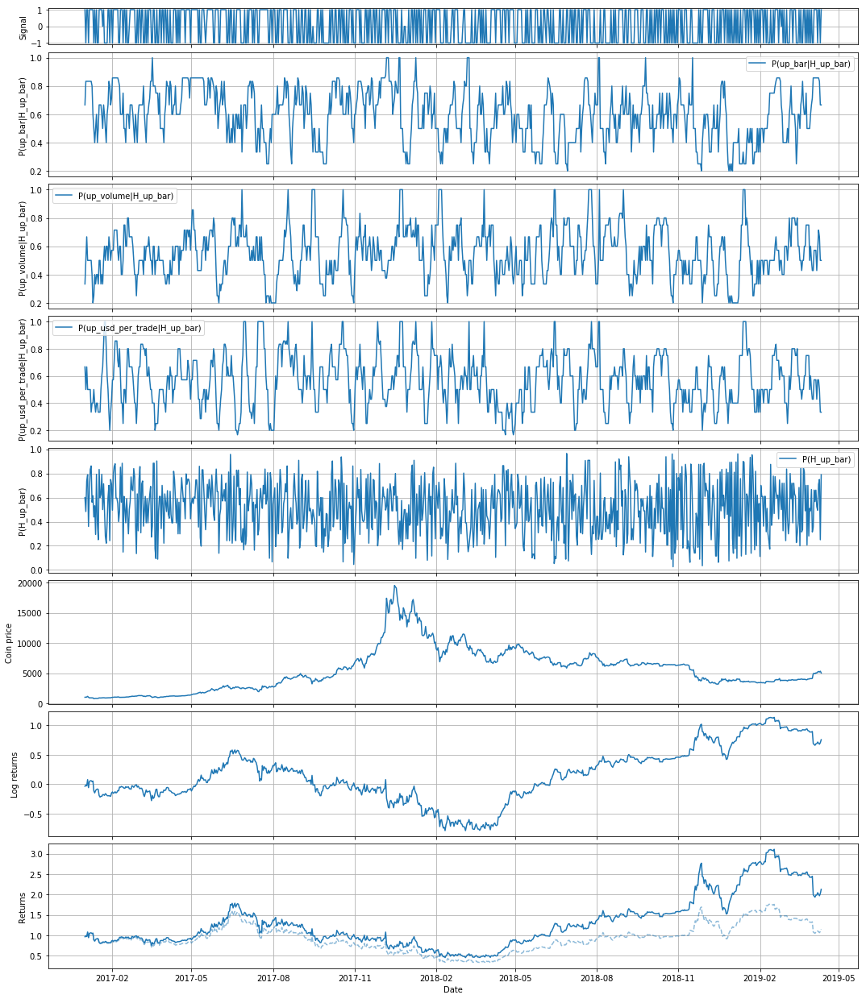

DF filtered 2017-01-01 00:00:00+00:00 to 2019-04-11 00:00:00+00:00
#[7, False, False]
	Returns: 2.1293715203649146
	Returns after fees: 1.149233929526415
	SR: 0.3441162399612039
	SR (after fees): 0.03597588199473062
	% bars right: 0.5110294117647058
	% bars in market: 0.9819494584837545
	Bars count: 831


In [13]:
# CELL 12
df["usd_per_trade"] = df["volume_usd"] / df["num_trades_in_bar"]
df["usd_per_trade"] = df["usd_per_trade"].ffill()
features = {
    "up_bar": lambda df: df["pct_change"] >= 0,
    "~up_bar": lambda df: df["pct_change"] < 0,
    "up_volume": lambda df: df["volume_usd"] >= df["volume_usd"].shift(1),
    "~up_volume": lambda df: df["volume_usd"] < df["volume_usd"].shift(1),
    "up_usd_per_trade": lambda df: df["usd_per_trade"] >= df["usd_per_trade"].shift(1),
    "~up_usd_per_trade": lambda df: df["usd_per_trade"] < df["usd_per_trade"].shift(1),
}

naive_bayes_analysis_options = analysis_options.copy()
naive_bayes_analysis_options["extra_columns"] = \
    [f"P({f}|H_up_bar)" for f in features.keys() if not f.startswith("~")] + ["P(H_up_bar)"]
    
use_ignoran_priors = False
use_bet_sizing = False

for history_bars in [365, 180, 90, 60, 30, 14, 7]:
    simulation_result = notebook_utils.simulate(naive_bayes_signal, df, history_bars, use_ignoran_priors, use_bet_sizing, features)
    analysis_result = notebook_utils.graph_print_analyze_simulation_result(simulation_result, naive_bayes_analysis_options)